## 1) Importación de librerías necesarias

In [1]:
import pandas as pd
import os
import numpy as np
from PIL import Image
import pickle
import random
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
from sklearn.model_selection import train_test_split

In [3]:
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.losses import categorical_crossentropy

In [4]:
from alibi.explainers import AnchorImage
from alibi.explainers import IntegratedGradients
from alibi.explainers import GradientSimilarity

## 2) Funciones que se van a usar

In [5]:
"""
Given the main directory of the location of the images, the URL of each image is loaded to a dataframe with his clasification
"""
def loadData(path_main_directory):
    paths_list = list()
    label_list = list()

    for subdirectory in os.listdir(path_main_directory):
        #Build the path of every subdirectory of the main_directory
        path_subdirectory = os.path.join(path_main_directory, subdirectory)

        #Iterate over all the images of the subdirectory adding the path to the dictionary
        for image_name in os.listdir(path_subdirectory):
            image_path = os.path.join(path_subdirectory, image_name)
            paths_list.append(image_path)
            label_list.append(subdirectory)

        init_data_dict = {'path' : paths_list, 'label' : label_list}

    return pd.DataFrame(init_data_dict)

In [6]:
def loadImages(tams_L, images_path_L, images_class_L):
    images_BW_D = dict()

    for i in range(0, len(tams_L)):
        #List of the representation of the images in black and white as a list
        imgs_BW_L = list()
        #List of the class of each image
        class_BW_L = list()

        for j in range(0, len(images_path_L)):
            #Open image and resize it
            img = Image.open(images_path_L[j]).resize(tams_L[i])
            #Image as a list
            arr = np.asarray(img, dtype = np.int_)
            
            imgs_BW_L.append(arr)
            class_BW_L.append(images_class_L[j])

        images_BW_D[i] = (imgs_BW_L, class_BW_L)
    
    return images_BW_D

In [7]:
def class_to_numeric(lista):
    l = list()
    for i in range (0, len(lista)):
        if(lista[i] == 'angry'):
            l.append(0)
        elif(lista[i] == 'happy'):
            l.append(1)
        elif(lista[i] == 'sad'):
            l.append(2)
    return np.array(l)

In [8]:
def numeric_to_class(type):
    if(type == 0):
        return 'angry'
    elif(type == 1):
        return 'happy'
    else:
        return 'sad'

In [9]:
def decode(class_list):
    if(class_list[0] == 1):
        return 'angry'
    elif(class_list[1] == 1):
        return 'happy'
    else:
        return 'sad'

In [10]:
int_to_str = {0: 'angry', 1: 'happy', 2: 'sad'}

## 3) Explicabilidad

### Carga del modelo

In [11]:
#load the cnn model from the pickle file
model_pkl_file = "./CNN_classifier_fer3.pkl"

with open(model_pkl_file, 'rb') as file:
    model = pickle.load(file)

In [12]:
# Visualize the summary of the best model
print("Input size:", model.layers[0].input_shape)
print("Activation function: ", model.layers[1].activation)
print("Kernel size: ", model.layers[1].kernel_size)
print("Pool size: ", model.layers[2].pool_size)

Input size: [(None, 48, 48, 1)]
Activation function:  <function relu at 0x000001895E87ACA0>
Kernel size:  (6, 6)
Pool size:  (3, 3)


### Carga de los datos

Se van a elegir de forma aleatoria un subconjunto muy pequeño de imágenes del conjunto de datos inicial para mostrar sus explicaciones

In [13]:
#load the data from the dataset
init_data_df = loadData('./fer3')

#input size depending on the model
lista_l = list()
lista_l.append((model.layers[0].input_shape[0][1], model.layers[0].input_shape[0][2]))

#load the images from the dataset
load_images  = loadImages(lista_l, init_data_df['path'].values, init_data_df['label'].values)

In [14]:
#Dictionary with the train test splits for all the representations
load_train_test = dict()
for i in range(0, len(lista_l)):
    X_train, X_test, y_train, y_test = train_test_split(load_images[i][0], load_images[i][1], test_size=0.005,shuffle=True)
    load_train_test[i] = (np.array(X_train), np.array(X_test), np.array(y_train), np.array(y_test))
    print('X_train shape:', np.array(X_train).shape, 'y_train shape:', np.array(y_train).shape, 'X_test shape:', np.array(X_test).shape, 'y_test shape:', np.array(y_test).shape)

X_train shape: (19918, 48, 48) y_train shape: (19918,) X_test shape: (101, 48, 48) y_test shape: (101,)


In [15]:
#data conditioning for each model
train_test_conditioned = dict()

for i in range(0, len(lista_l)):
    X_train = load_train_test[i][0]
    X_train = X_train.astype('float32') / 255
    
    X_test = load_train_test[i][1]
    X_test = X_test.astype('float32') / 255
    
    y_train = load_train_test[i][2]
    y_train = class_to_numeric(y_train) # Converts the string class to numeric class
    y_train = to_categorical(y_train) # Converts the classes into one-hot-vector
    
    y_test = load_train_test[i][3]
    y_test = class_to_numeric(y_test) # Converts the string class to numeric class
    y_test = to_categorical(y_test) # Converts the classes into one-hot-vector

    print('X_train shape:', X_train.shape, 'X_test shape:', X_test.shape, 'y_train shape:', y_train.shape, 'y_test shape:', y_test.shape)
    
    train_test_conditioned[i] = (X_train, X_test, y_train, y_test)

X_train shape: (19918, 48, 48) X_test shape: (101, 48, 48) y_train shape: (19918, 3) y_test shape: (101, 3)


### Explicaciones

#### AnchorImage

4/4 [==============================] - 0s 5ms/step


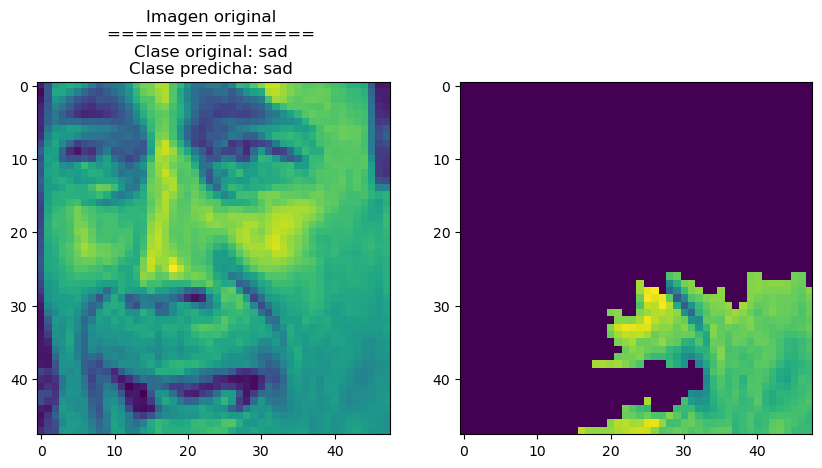

4/4 [==============================] - 0s 5ms/step


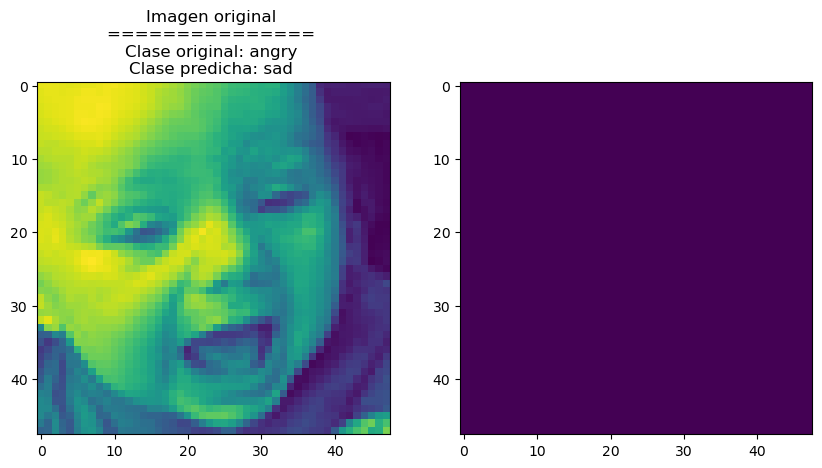

4/4 [==============================] - 0s 5ms/step


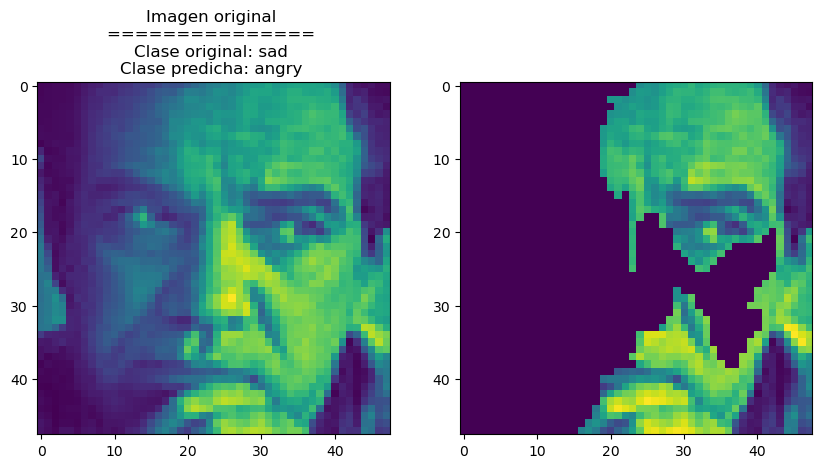

4/4 [==============================] - 0s 5ms/step


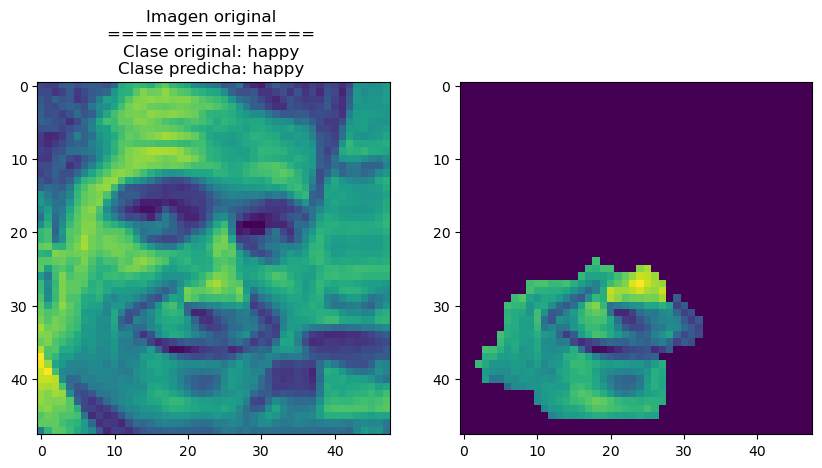

4/4 [==============================] - 0s 5ms/step


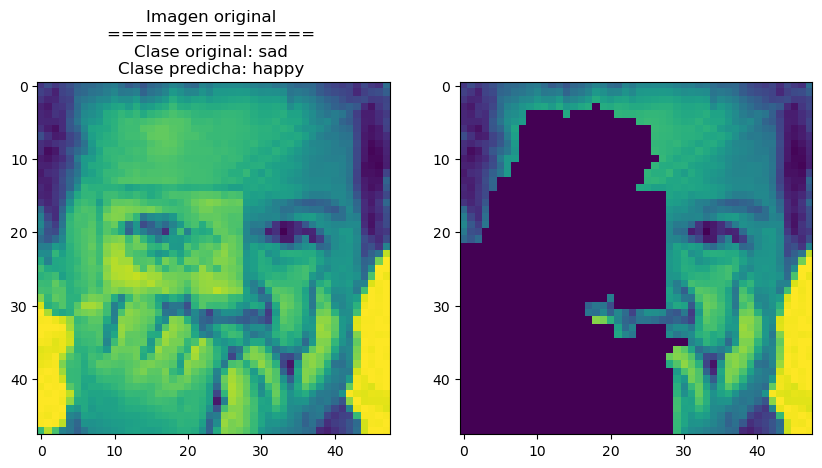

4/4 [==============================] - 0s 5ms/step


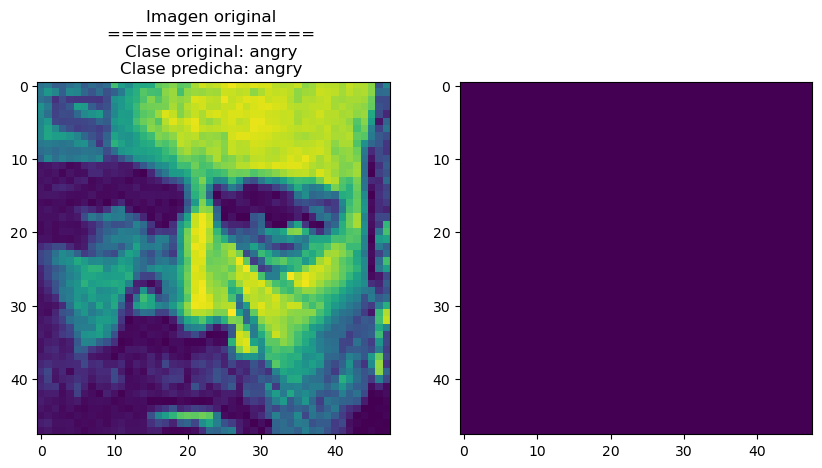

4/4 [==============================] - 0s 5ms/step


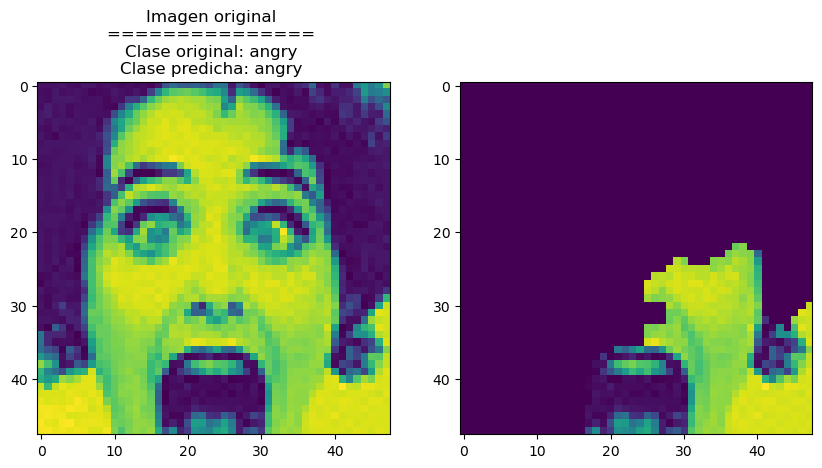

4/4 [==============================] - 0s 6ms/step


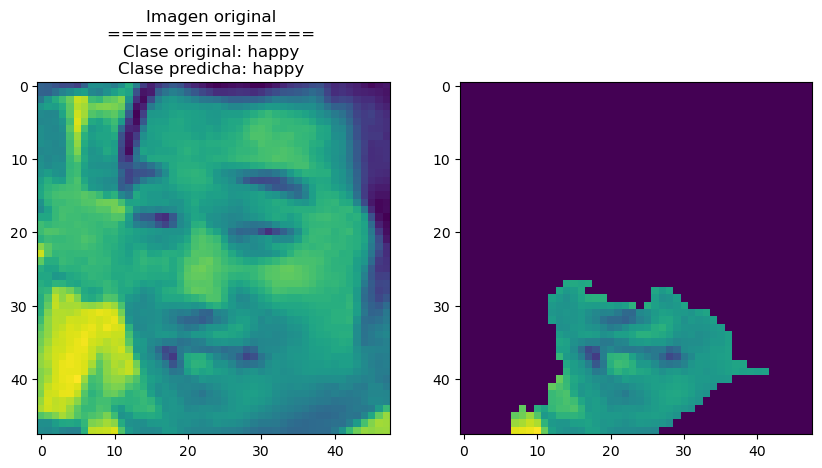

4/4 [==============================] - 0s 5ms/step


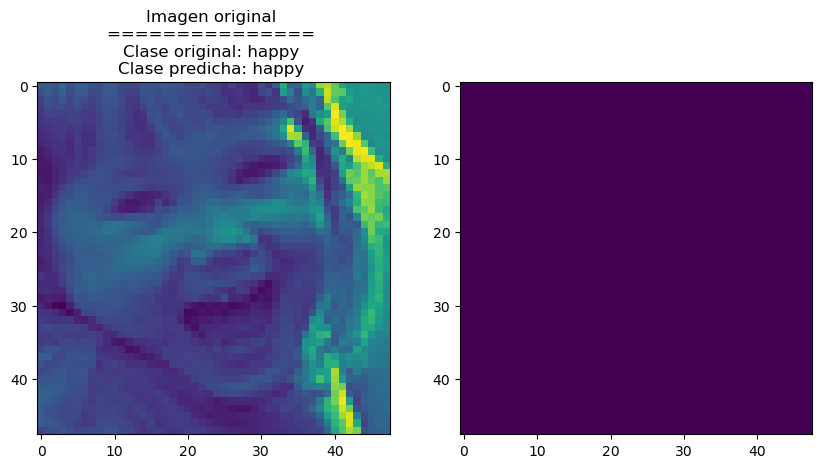

4/4 [==============================] - 0s 6ms/step


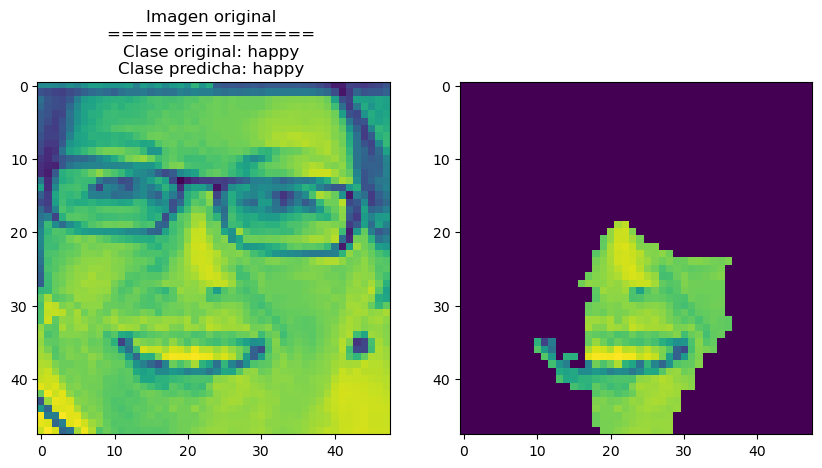

4/4 [==============================] - 0s 5ms/step


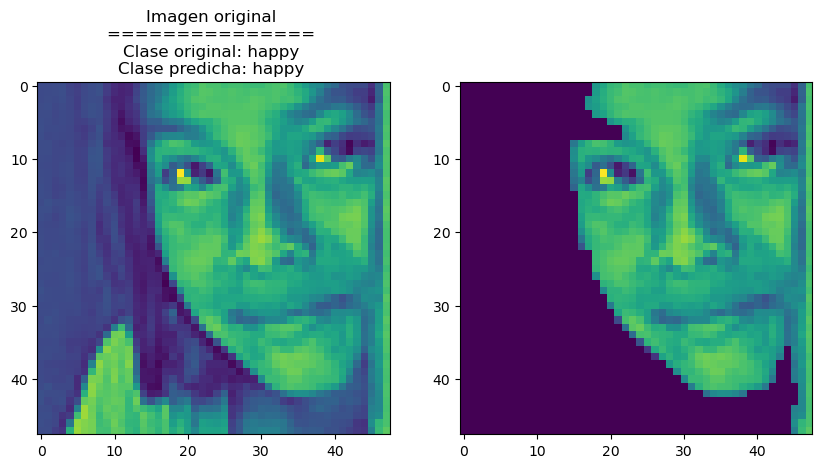

4/4 [==============================] - 0s 5ms/step


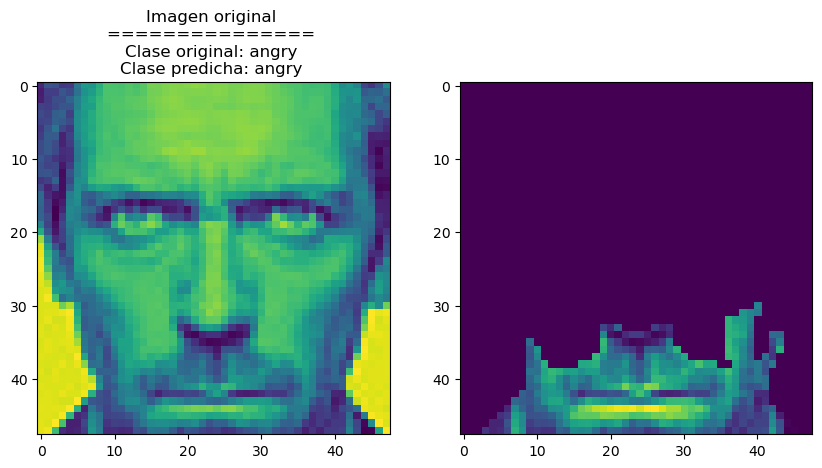

4/4 [==============================] - 0s 5ms/step


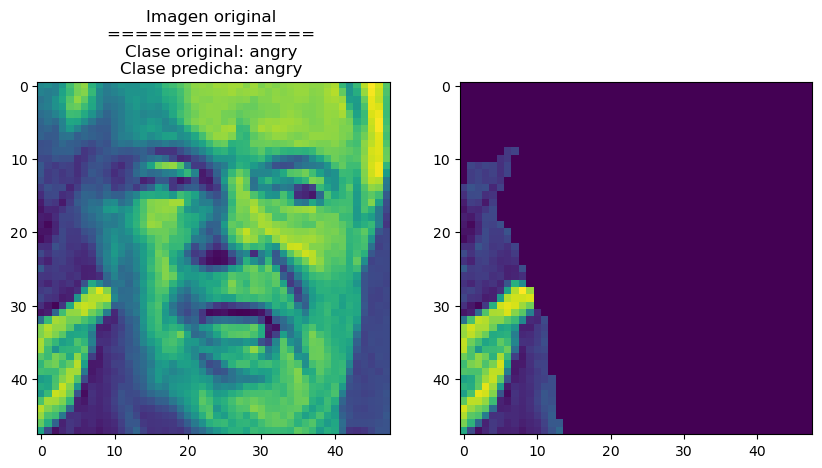

4/4 [==============================] - 0s 5ms/step


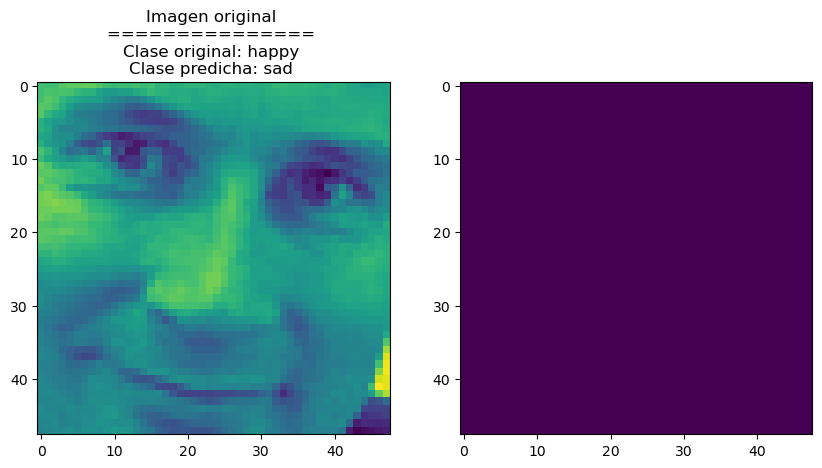

4/4 [==============================] - 0s 5ms/step


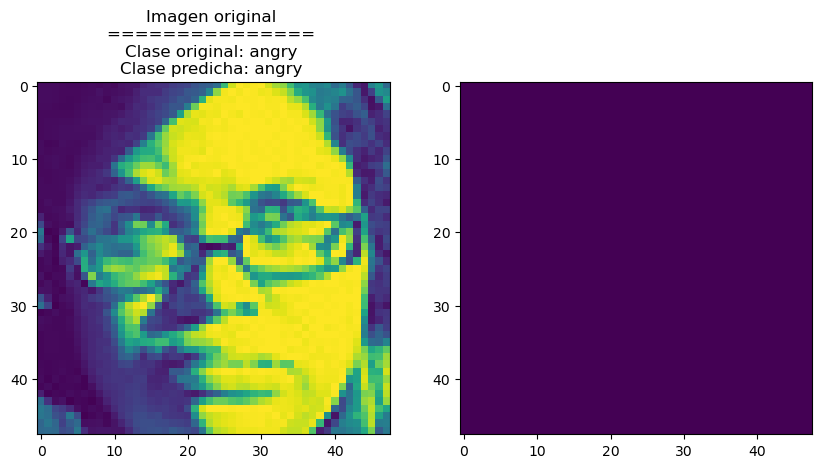

4/4 [==============================] - 0s 6ms/step


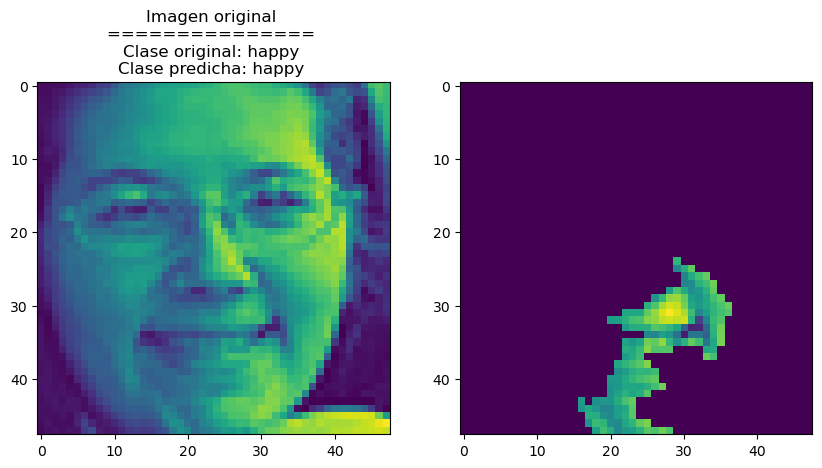

4/4 [==============================] - 0s 6ms/step


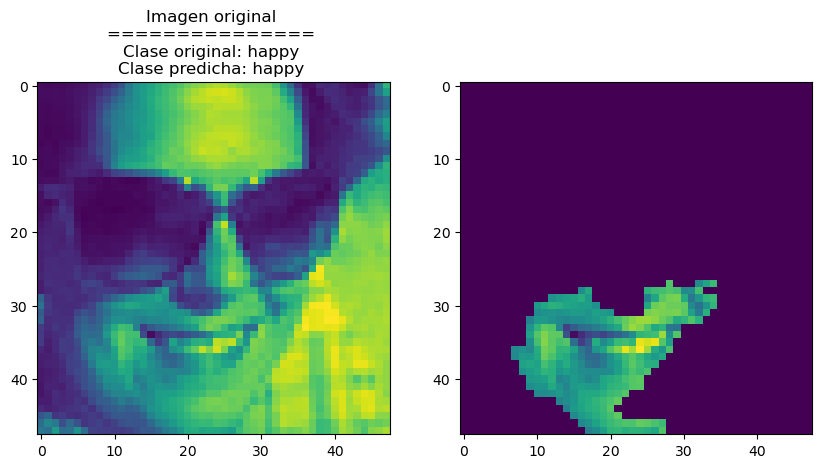

4/4 [==============================] - 0s 5ms/step


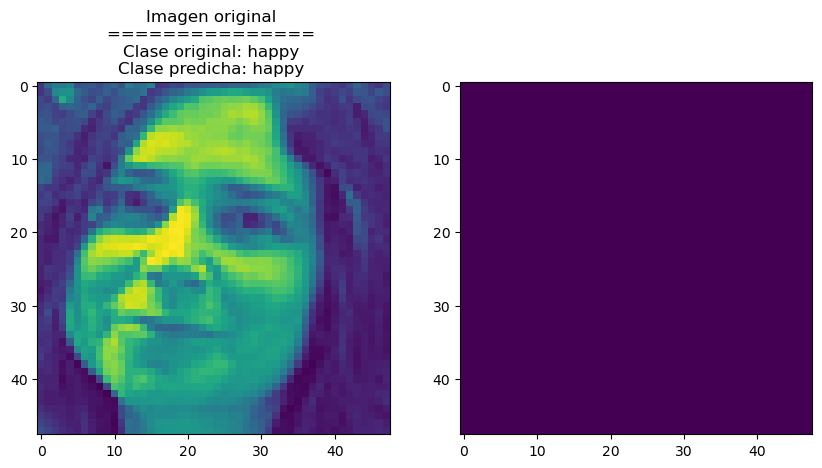

4/4 [==============================] - 0s 5ms/step


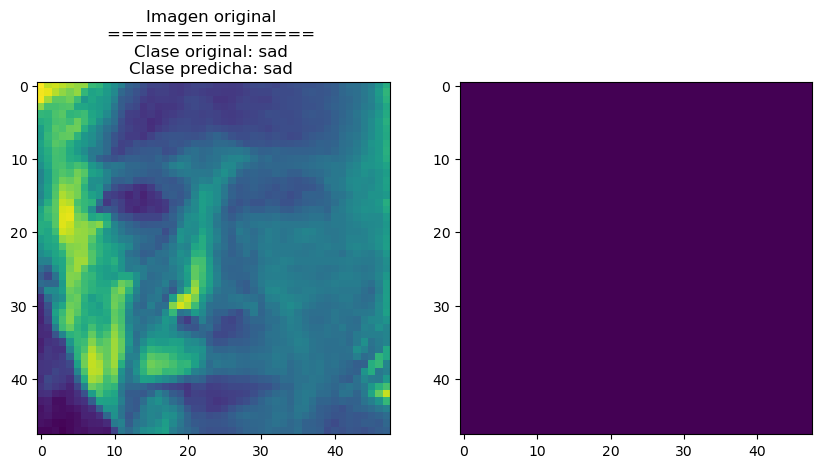

4/4 [==============================] - 0s 5ms/step


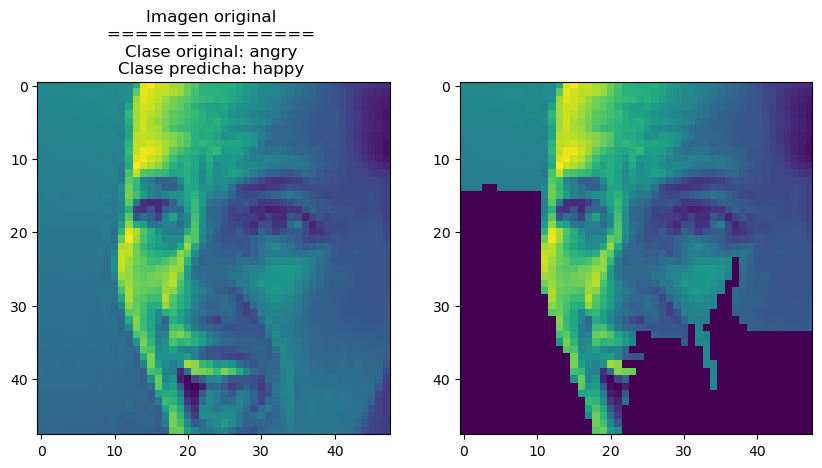

4/4 [==============================] - 0s 5ms/step


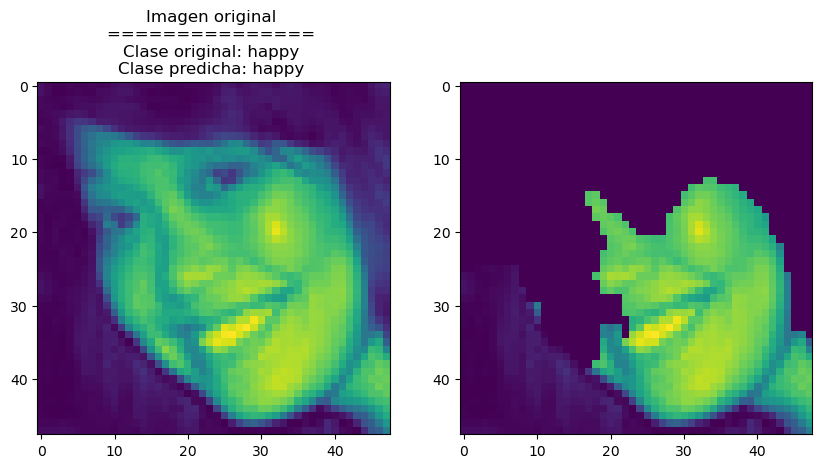

4/4 [==============================] - 0s 5ms/step


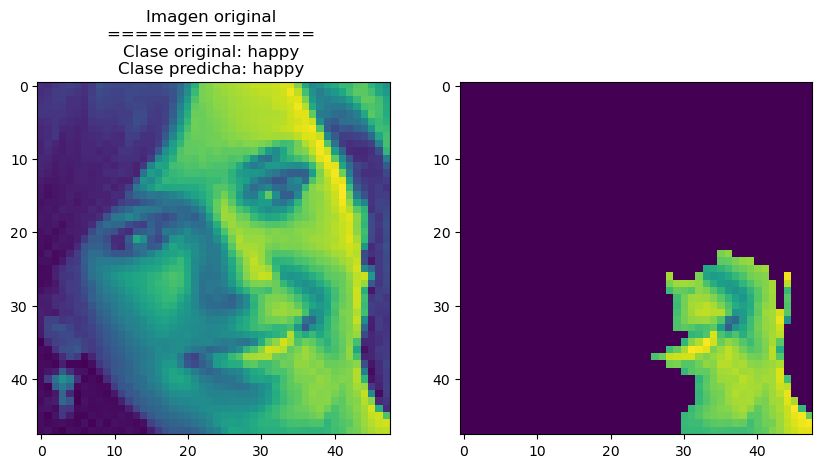

4/4 [==============================] - 0s 4ms/step


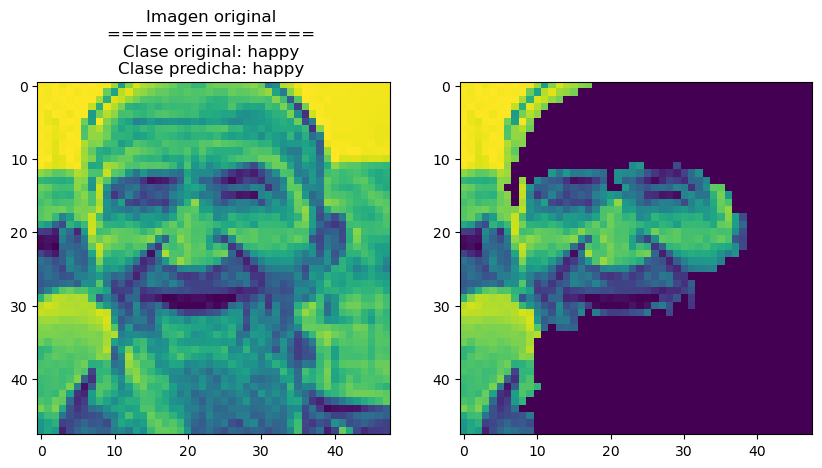

4/4 [==============================] - 0s 5ms/step


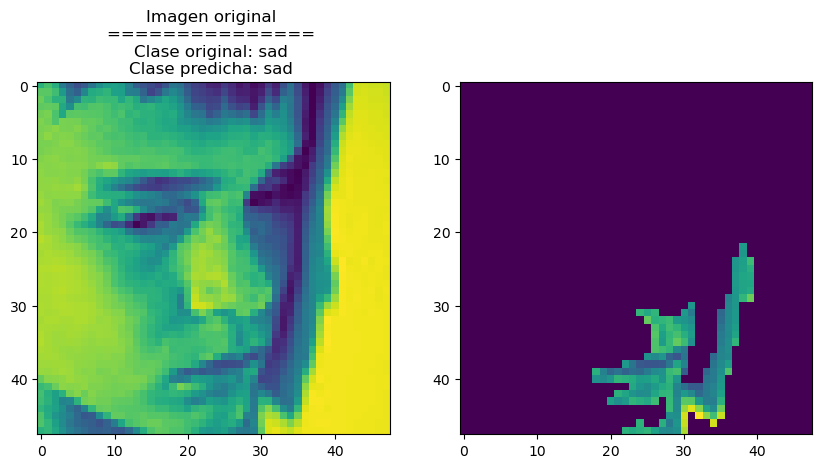

4/4 [==============================] - 0s 5ms/step


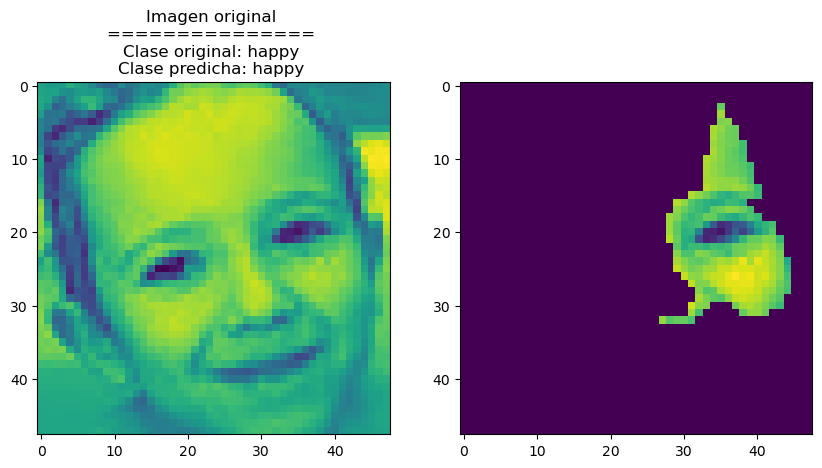

4/4 [==============================] - 0s 5ms/step


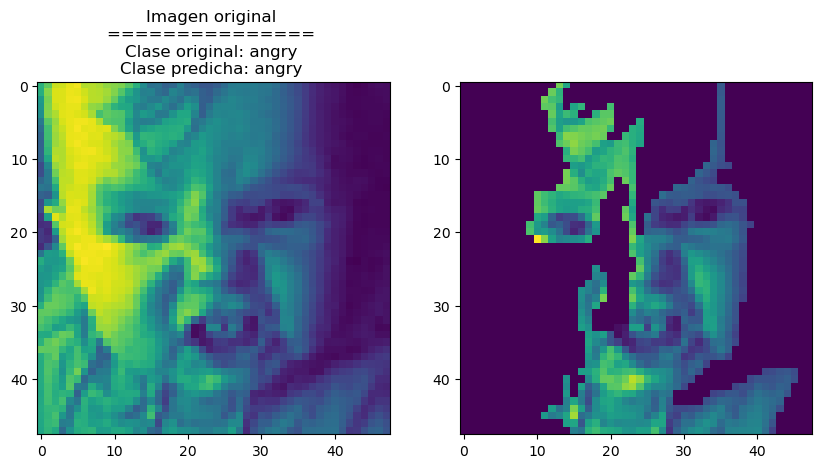

4/4 [==============================] - 0s 5ms/step


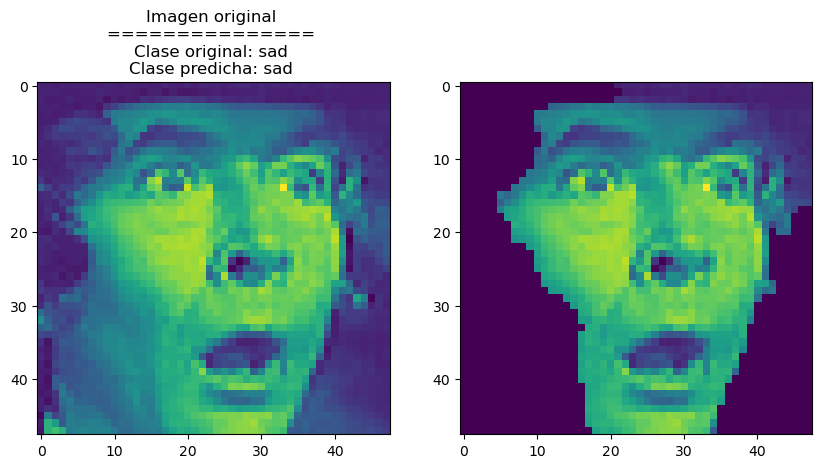

4/4 [==============================] - 0s 5ms/step


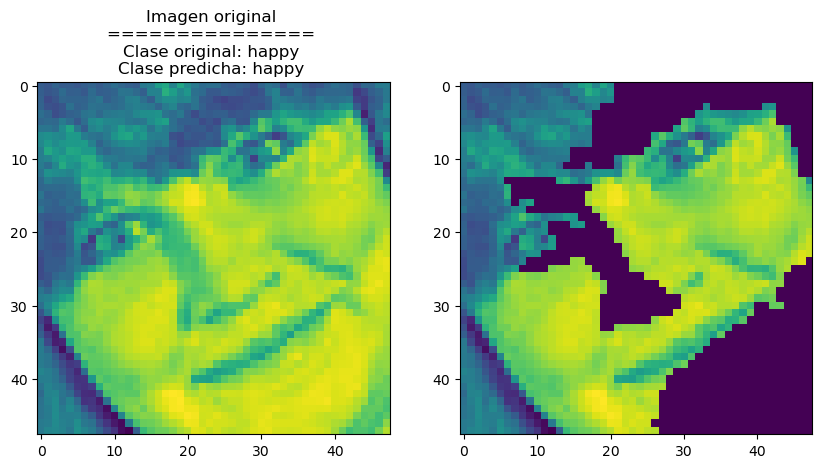

4/4 [==============================] - 0s 5ms/step


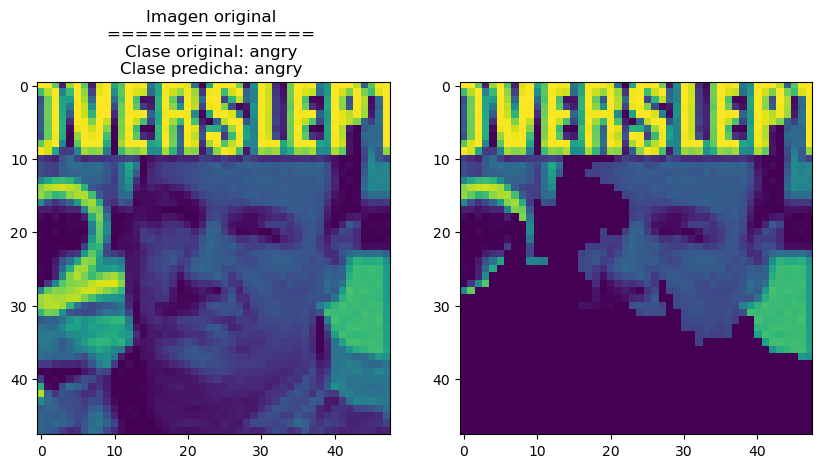

4/4 [==============================] - 0s 5ms/step


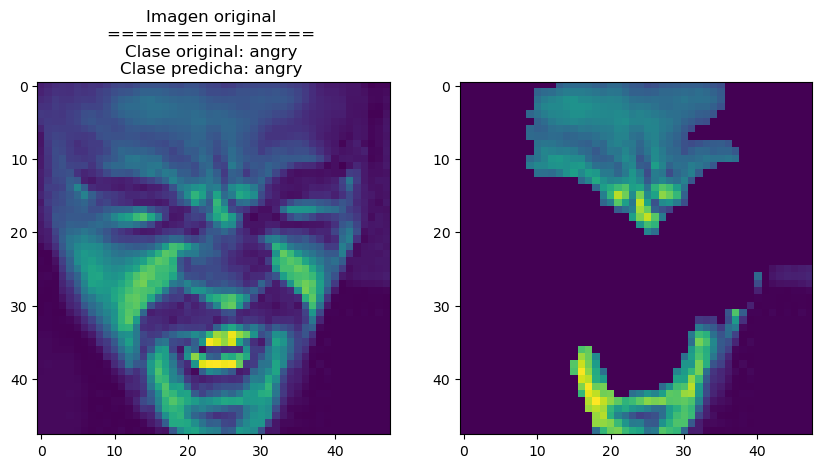

4/4 [==============================] - 0s 5ms/step


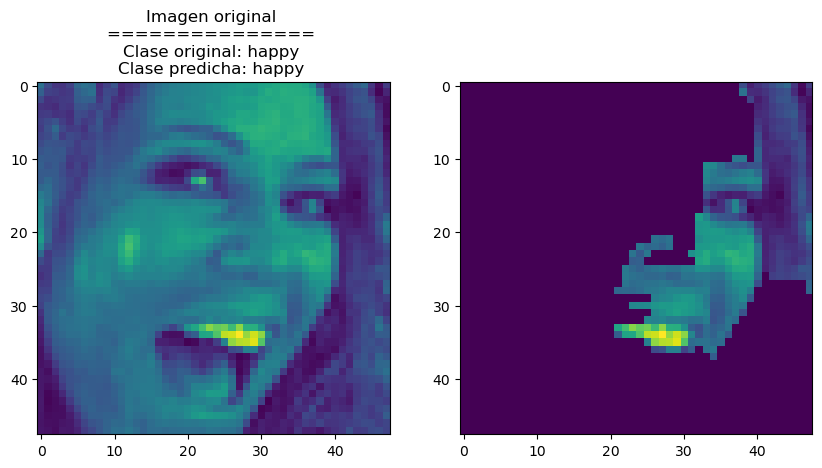

4/4 [==============================] - 0s 5ms/step


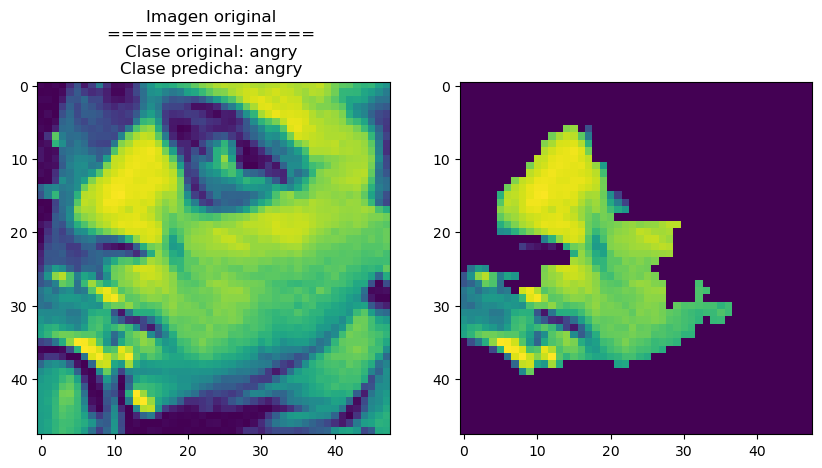

4/4 [==============================] - 0s 5ms/step


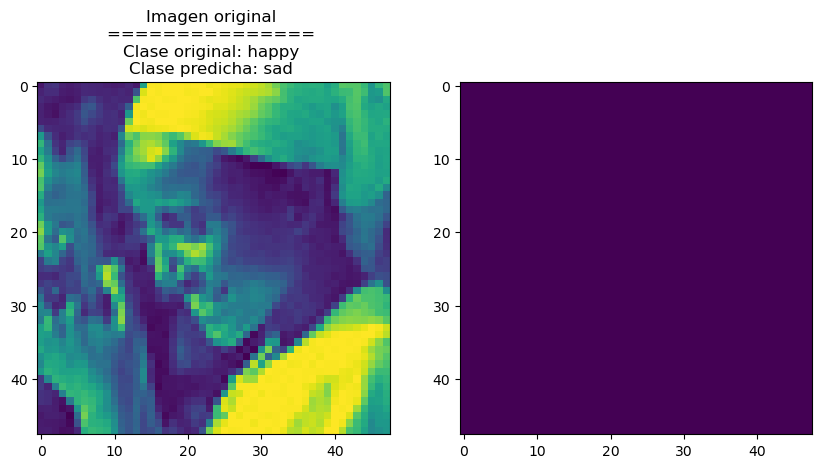

4/4 [==============================] - 0s 5ms/step


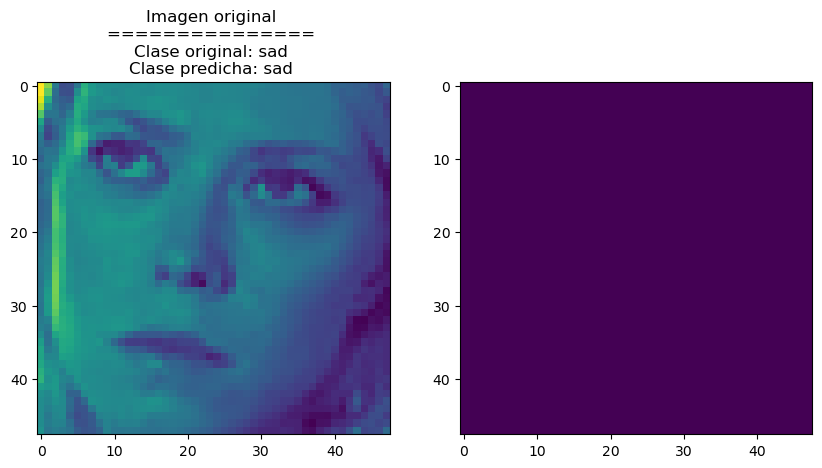

4/4 [==============================] - 0s 5ms/step


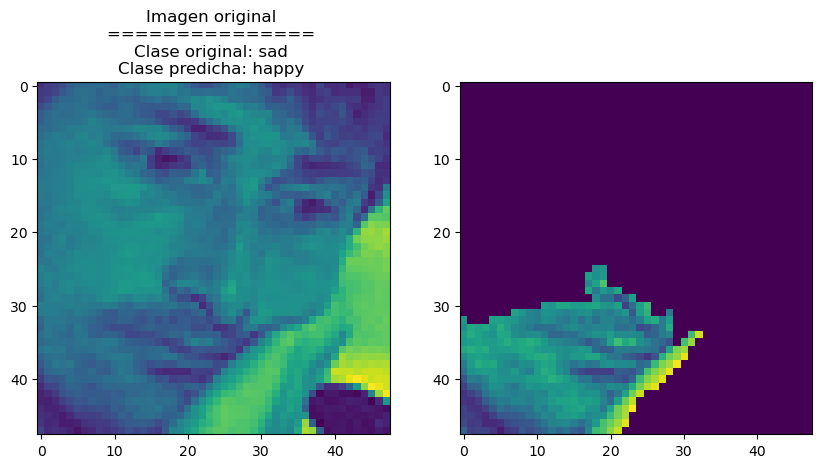

4/4 [==============================] - 0s 5ms/step


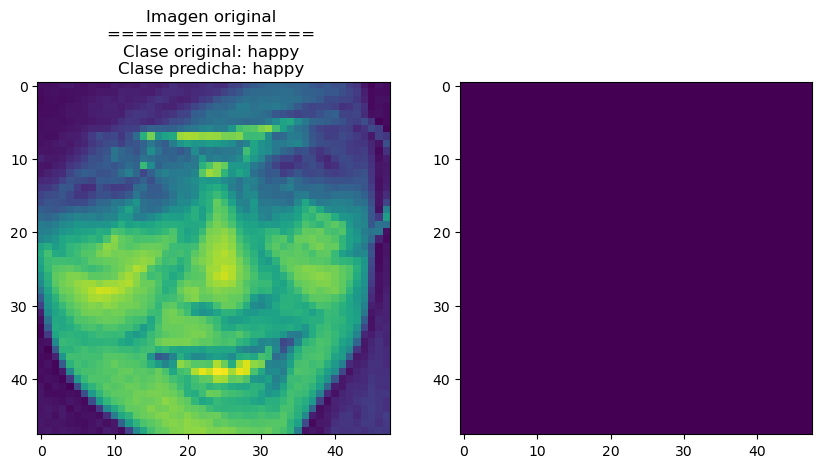

4/4 [==============================] - 0s 5ms/step


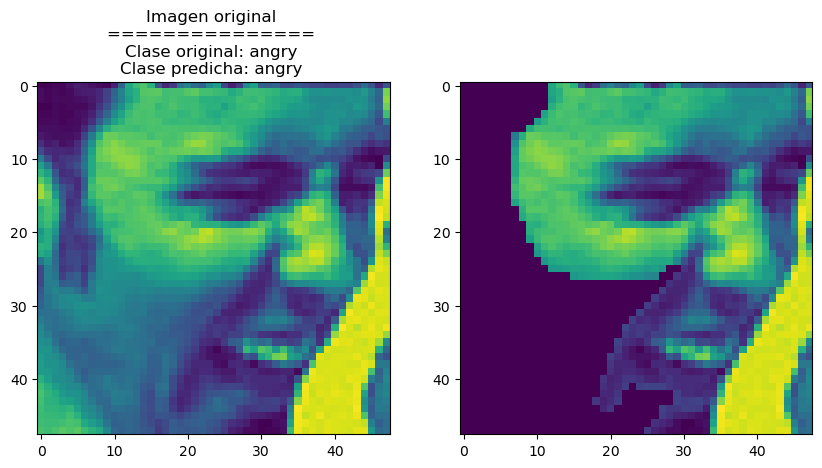

4/4 [==============================] - 0s 5ms/step


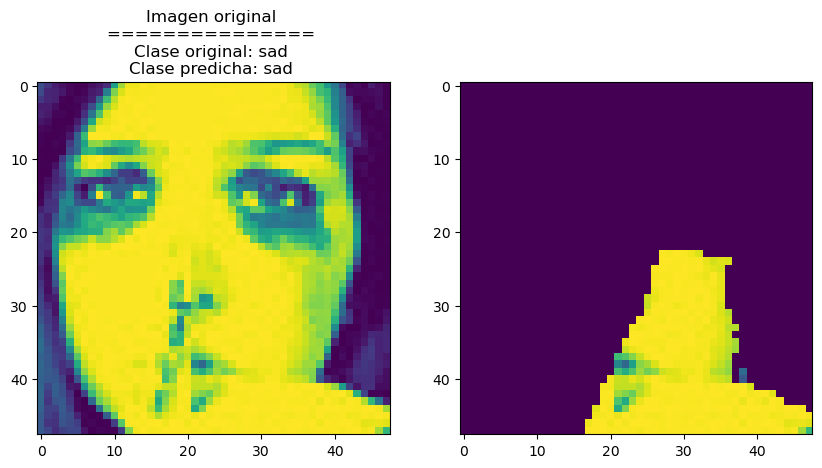

4/4 [==============================] - 0s 4ms/step


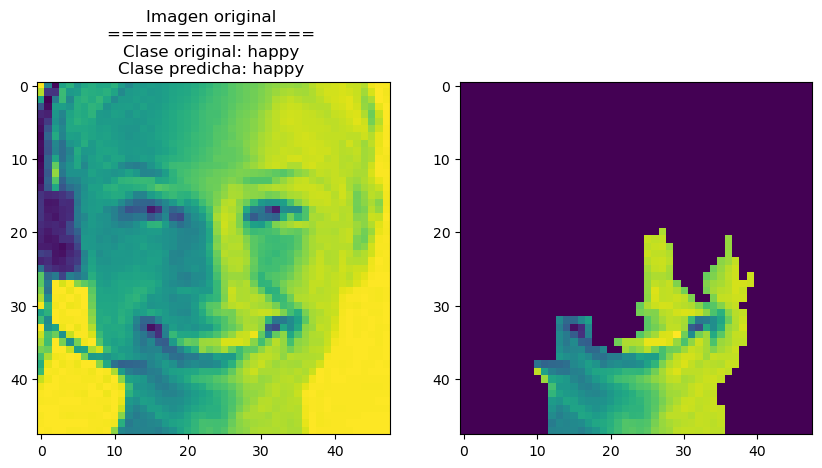

4/4 [==============================] - 0s 5ms/step


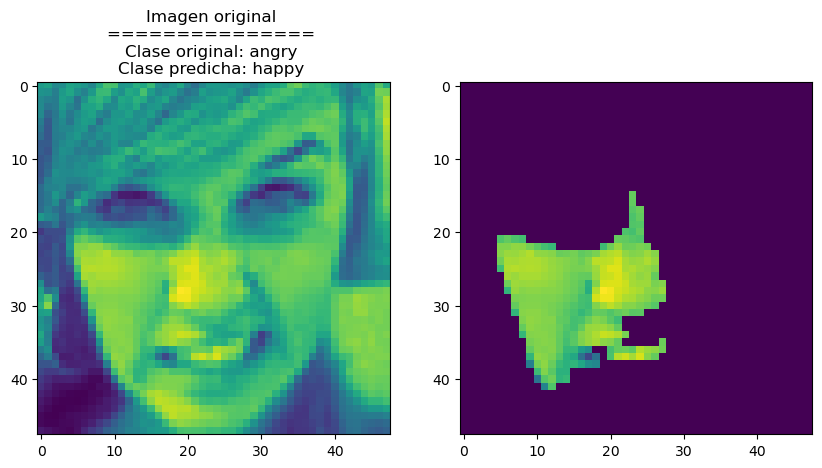

4/4 [==============================] - 0s 5ms/step


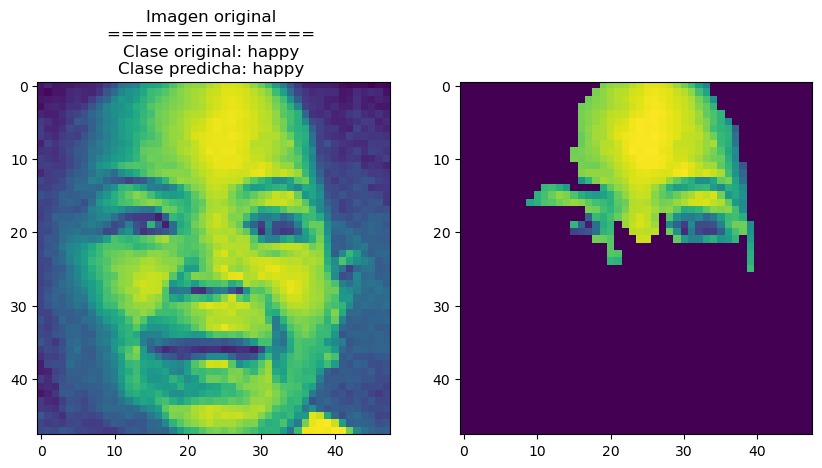

4/4 [==============================] - 0s 5ms/step


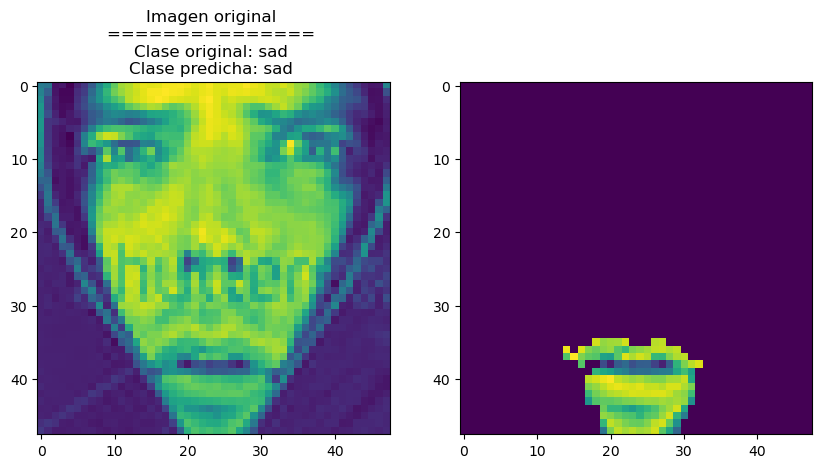

4/4 [==============================] - 0s 5ms/step


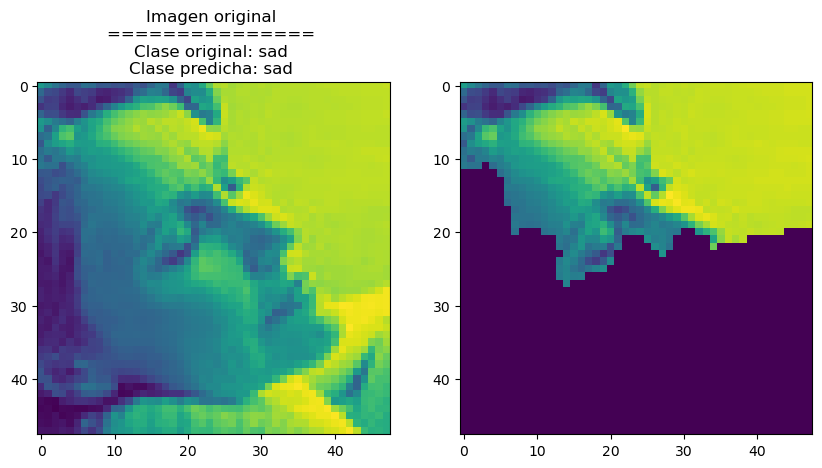

4/4 [==============================] - 0s 5ms/step


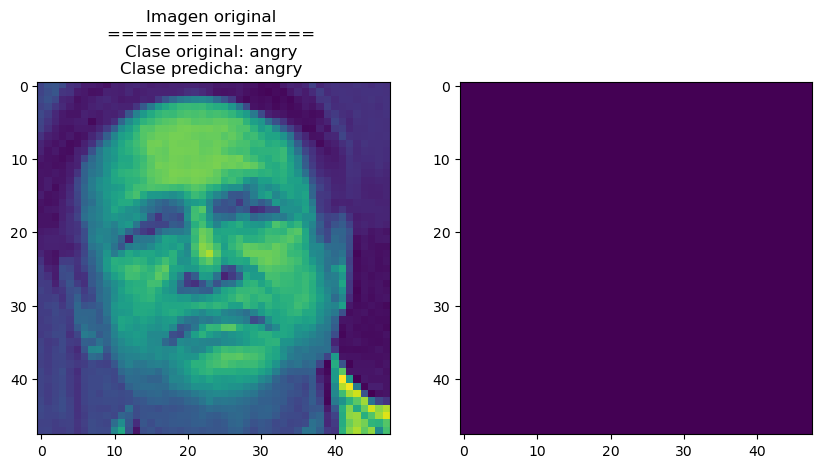

4/4 [==============================] - 0s 5ms/step


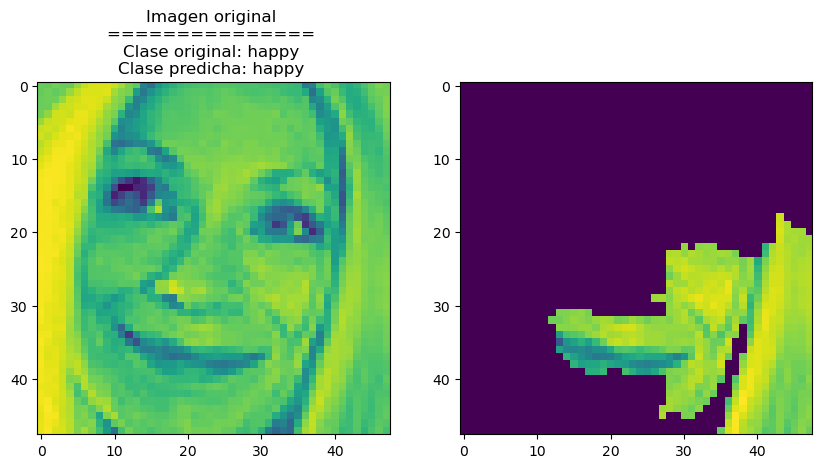

4/4 [==============================] - 0s 5ms/step


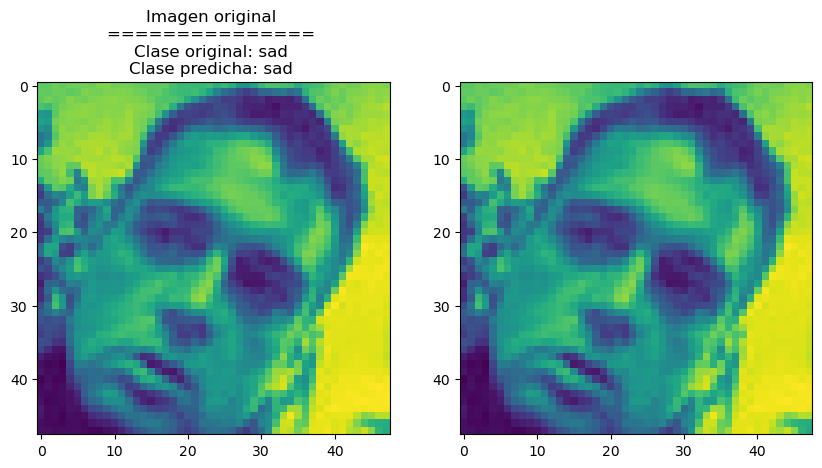

4/4 [==============================] - 0s 5ms/step


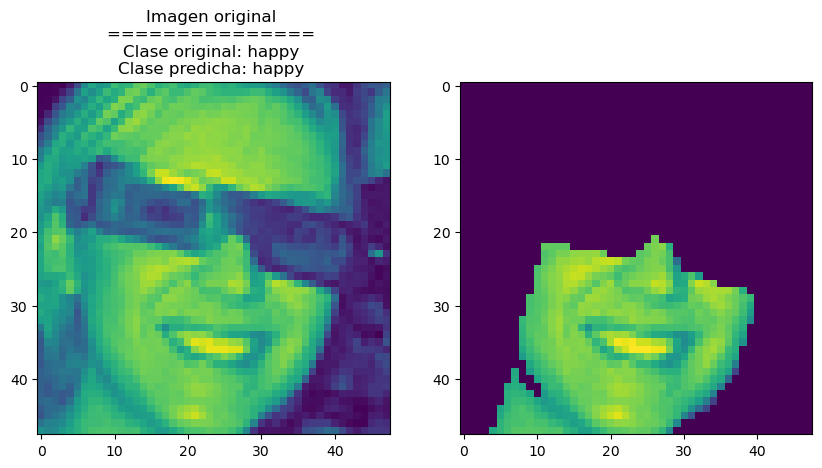

4/4 [==============================] - 0s 4ms/step


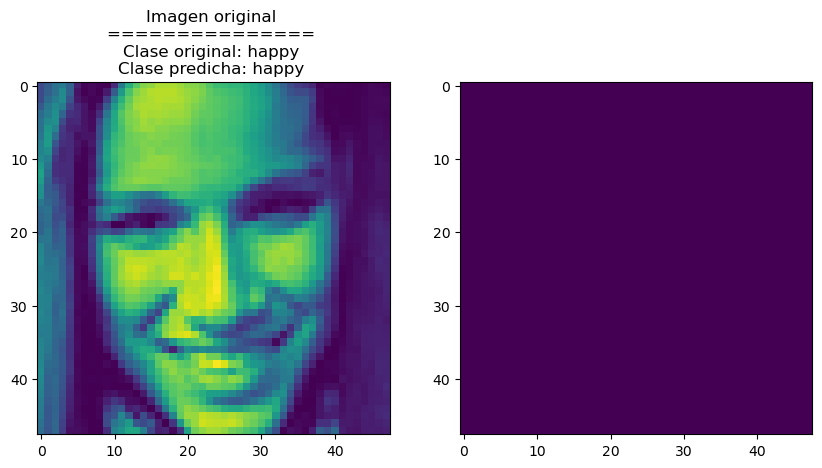

4/4 [==============================] - 0s 5ms/step


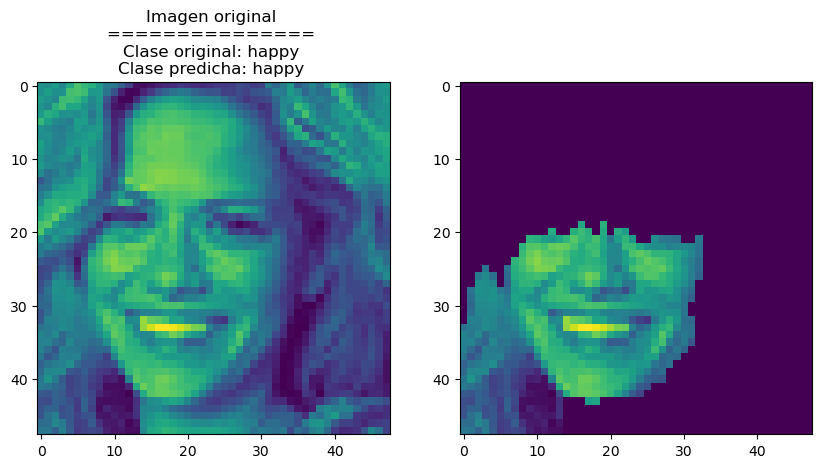

4/4 [==============================] - 0s 5ms/step


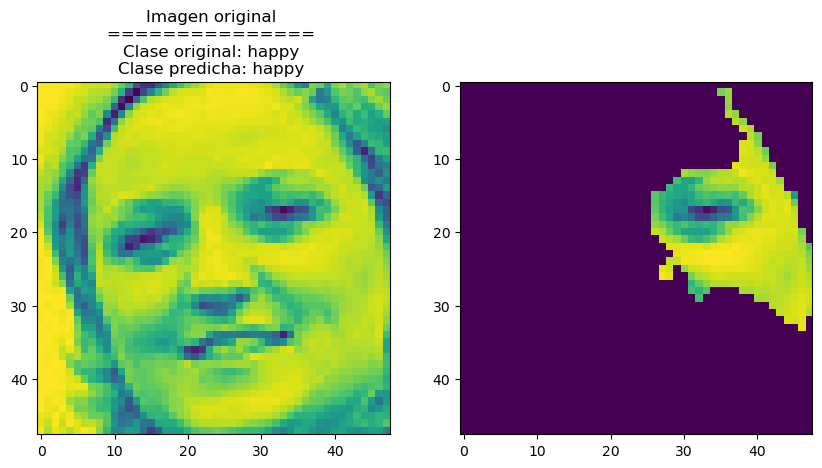

4/4 [==============================] - 0s 4ms/step


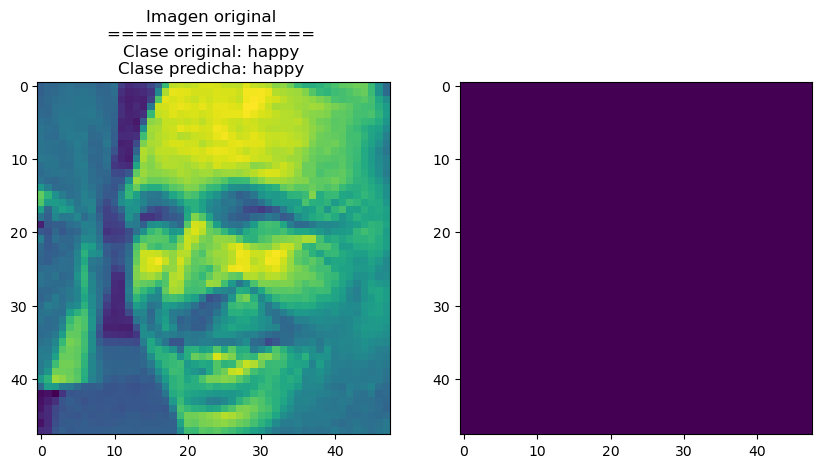

4/4 [==============================] - 0s 5ms/step


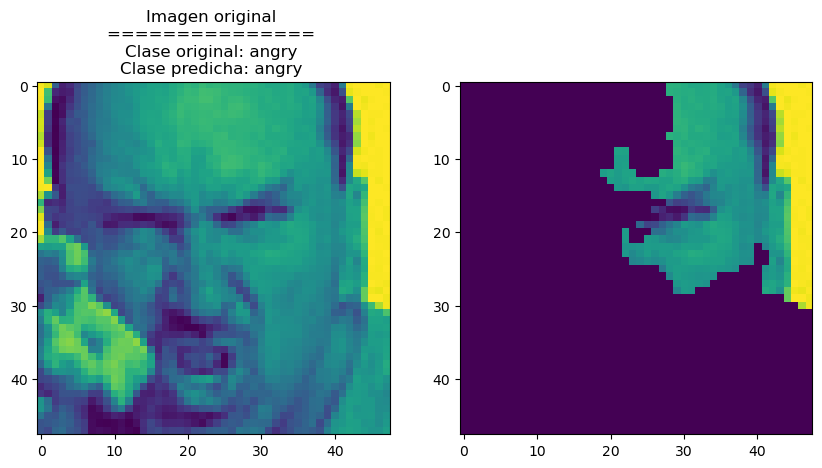

4/4 [==============================] - 0s 5ms/step


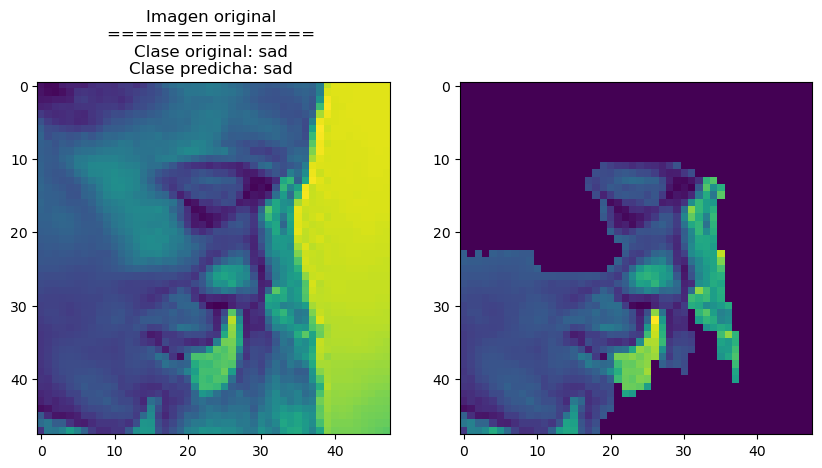

4/4 [==============================] - 0s 5ms/step


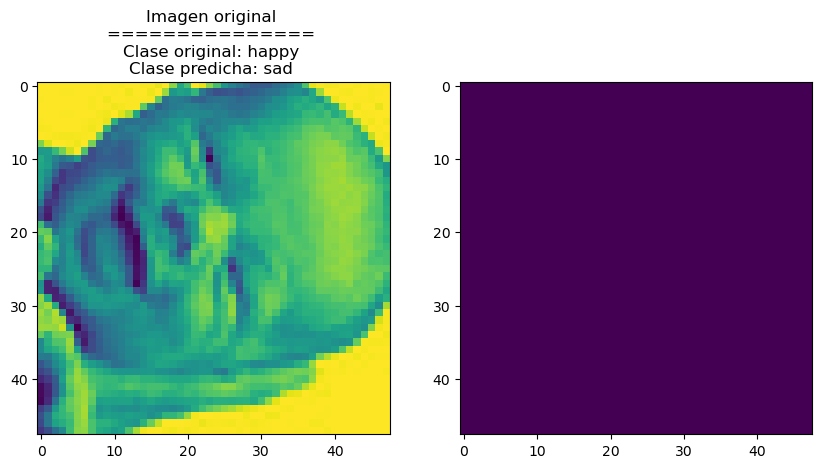

4/4 [==============================] - 0s 5ms/step


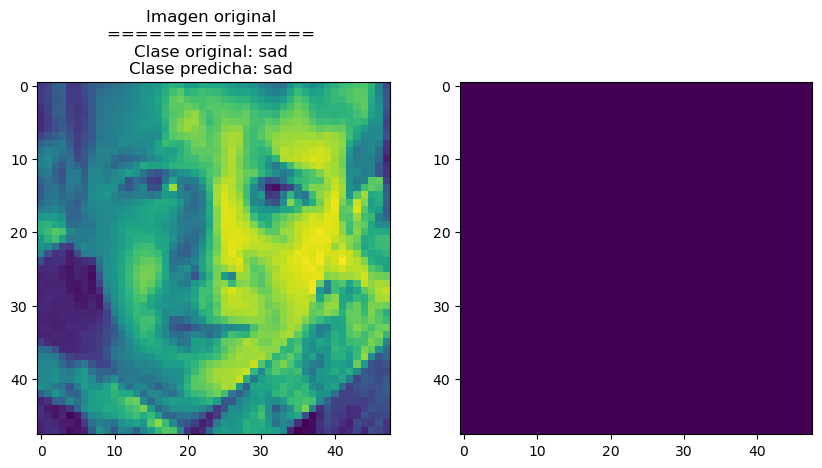

4/4 [==============================] - 0s 5ms/step


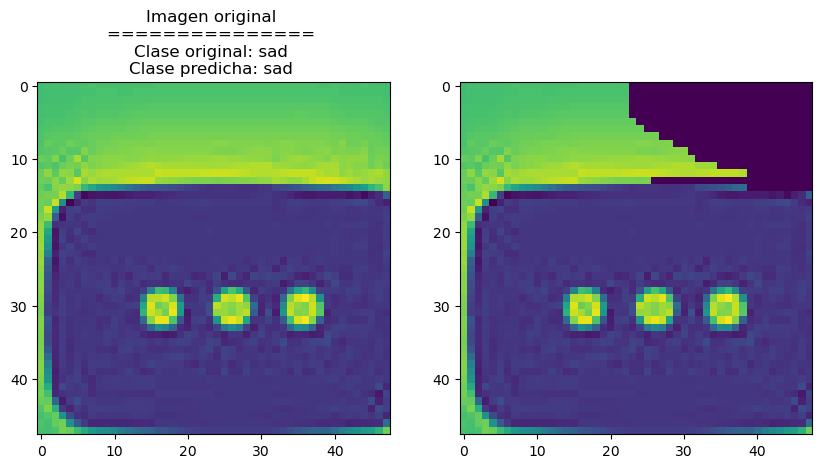

4/4 [==============================] - 0s 5ms/step


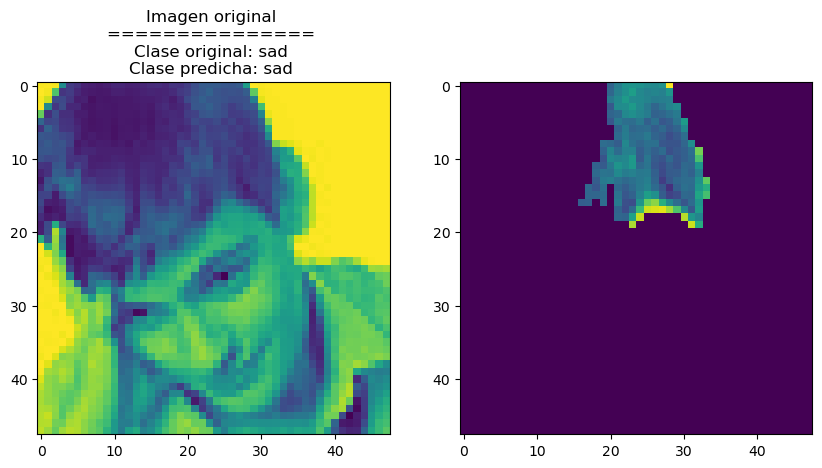

4/4 [==============================] - 0s 5ms/step


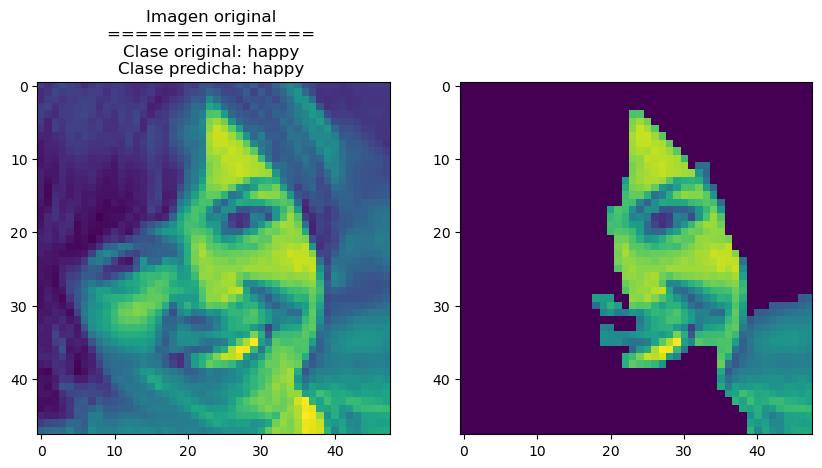

4/4 [==============================] - 0s 5ms/step


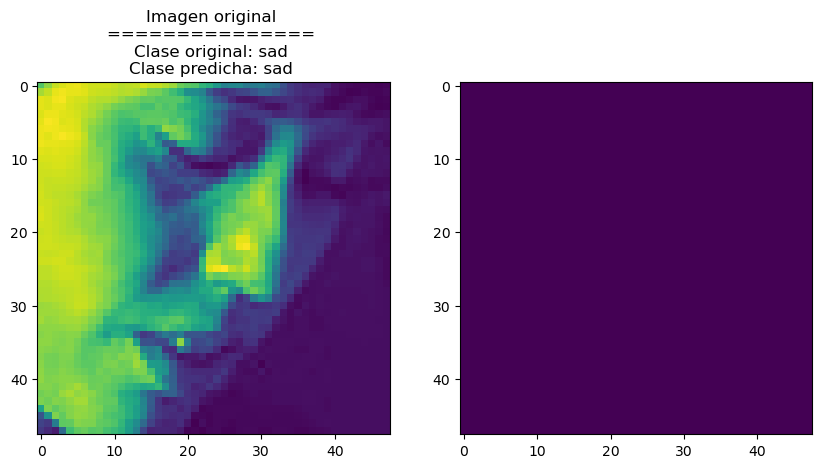

4/4 [==============================] - 0s 4ms/step


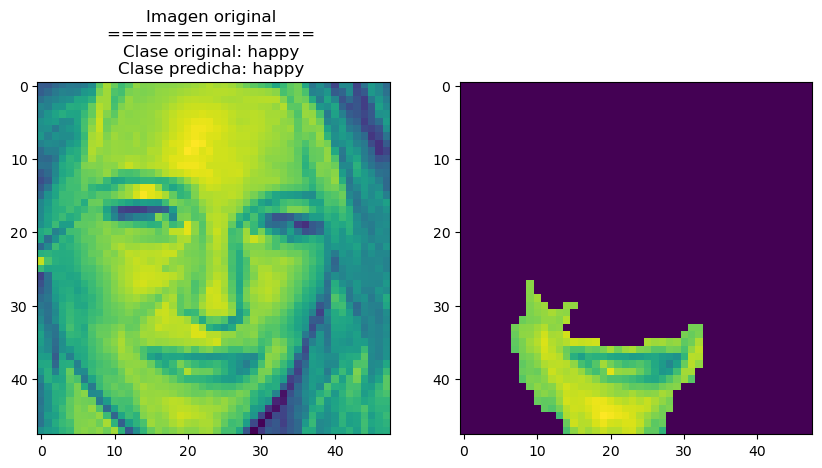

4/4 [==============================] - 0s 5ms/step


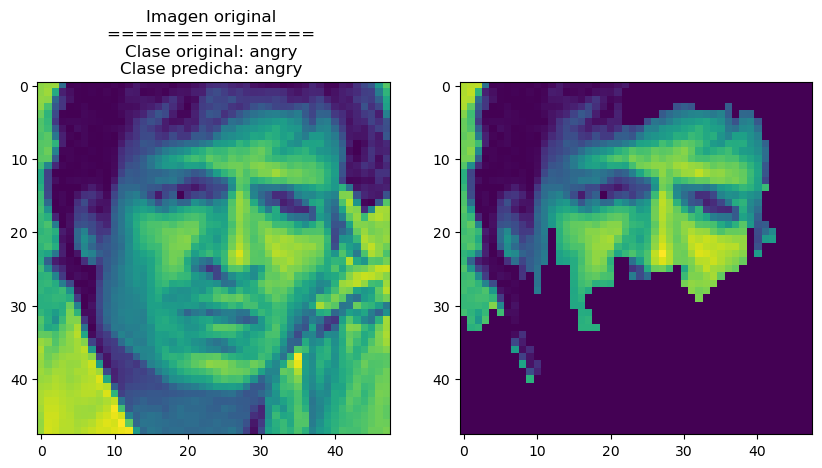

4/4 [==============================] - 0s 5ms/step


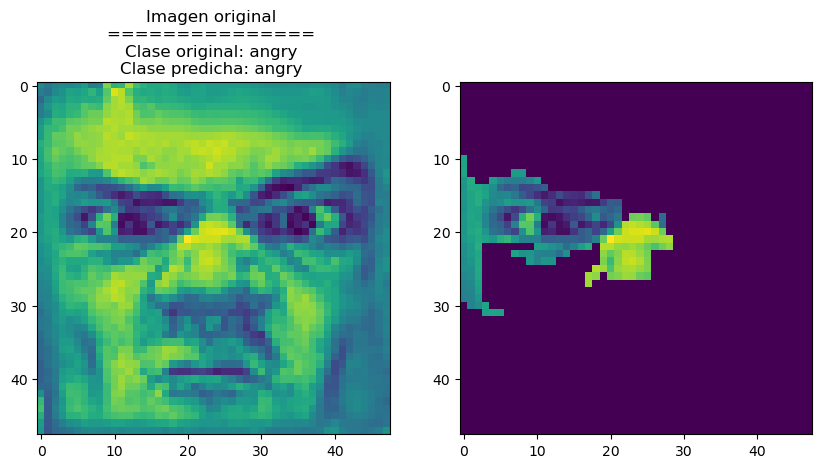

4/4 [==============================] - 0s 4ms/step


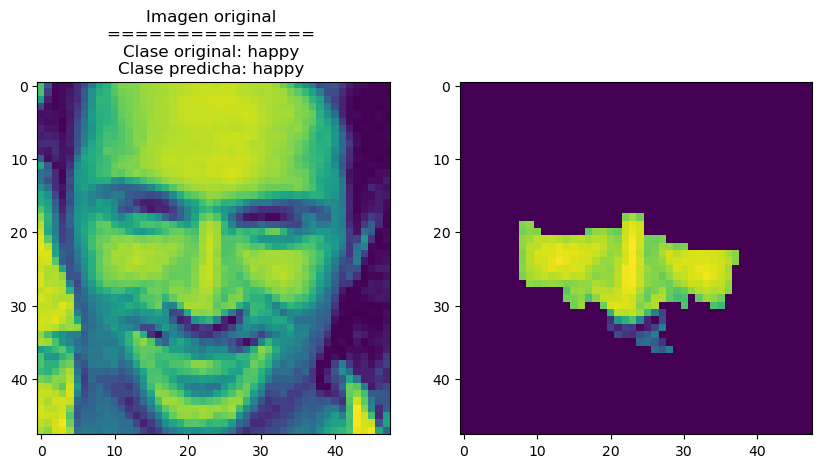

4/4 [==============================] - 0s 5ms/step


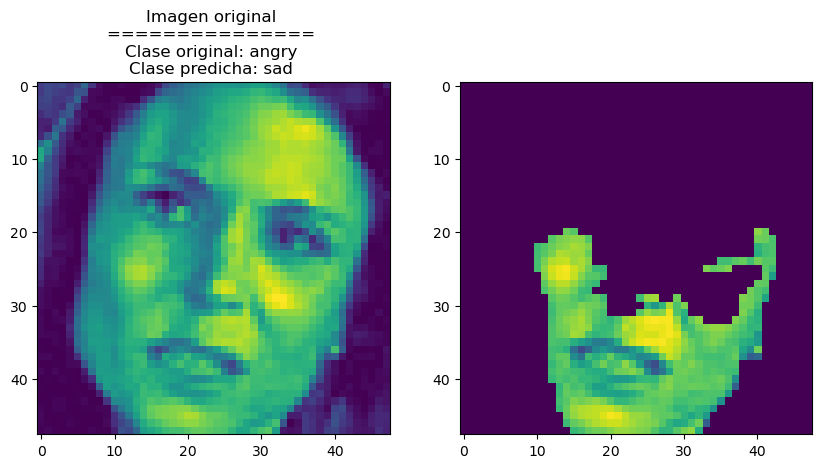

4/4 [==============================] - 0s 5ms/step


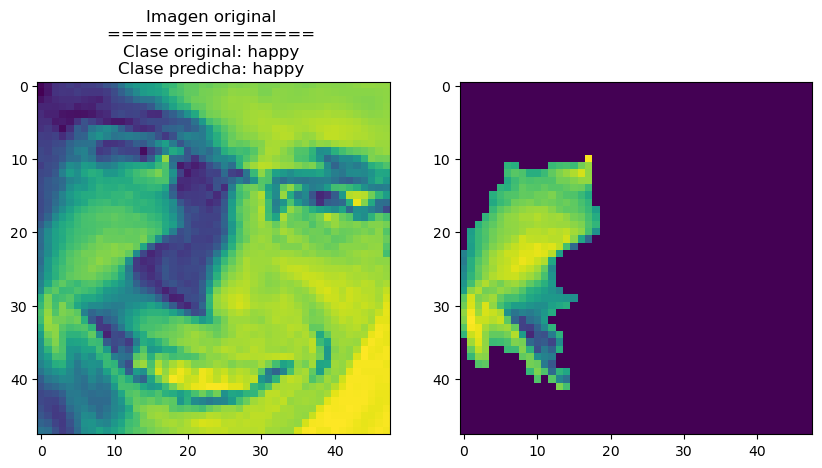

4/4 [==============================] - 0s 4ms/step


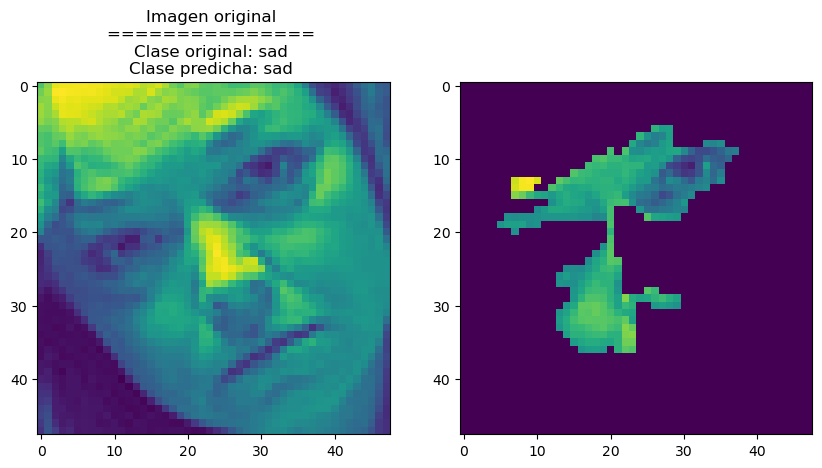

4/4 [==============================] - 0s 5ms/step


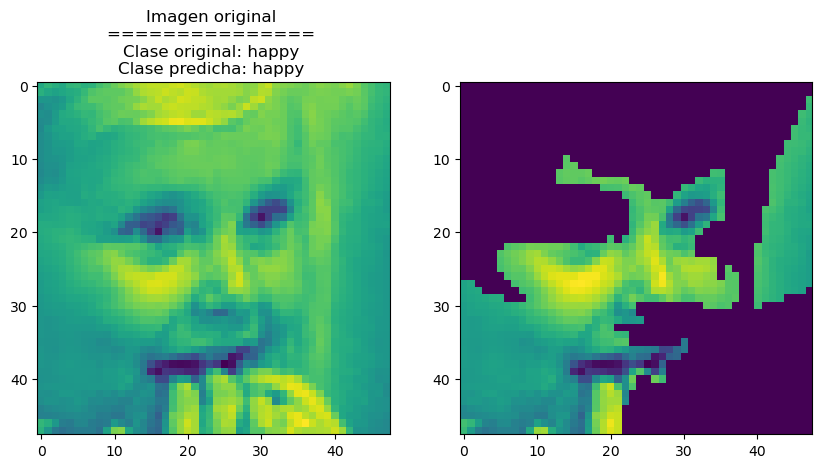

4/4 [==============================] - 0s 5ms/step


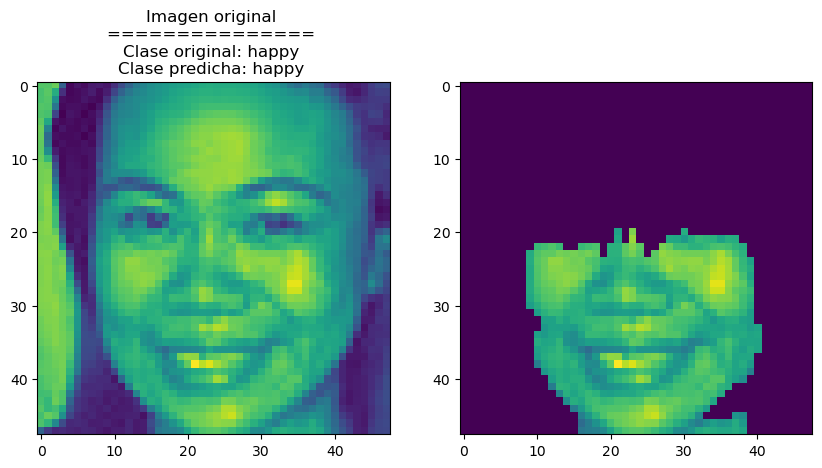

4/4 [==============================] - 0s 4ms/step


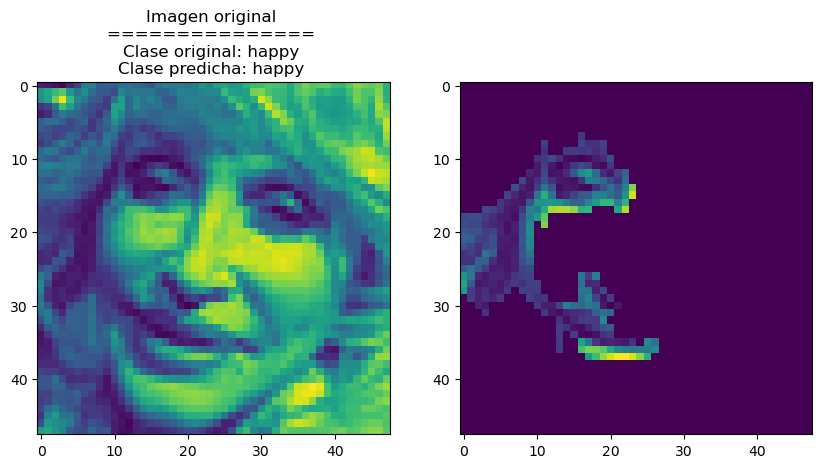

4/4 [==============================] - 0s 5ms/step


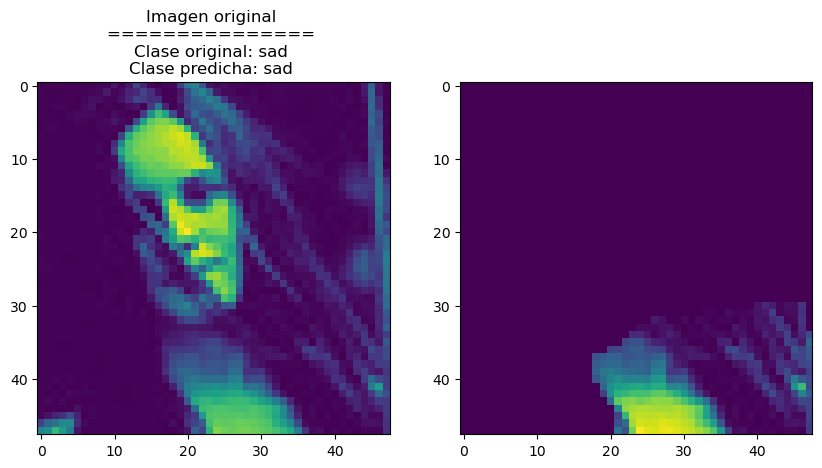

4/4 [==============================] - 0s 5ms/step


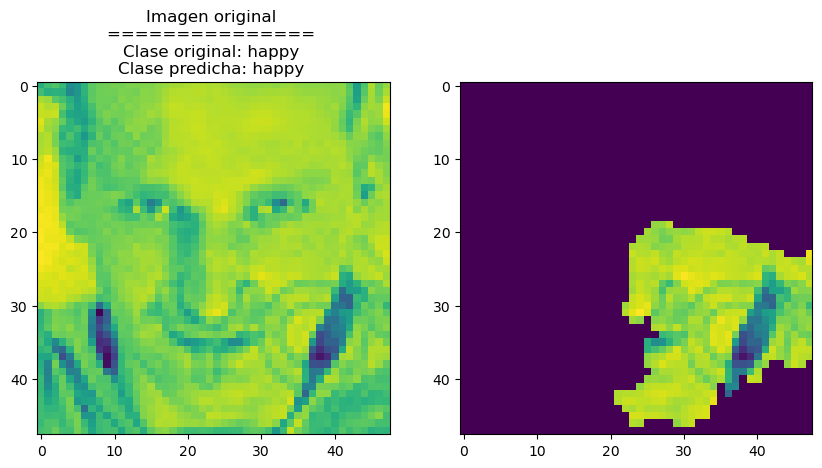

4/4 [==============================] - 0s 5ms/step


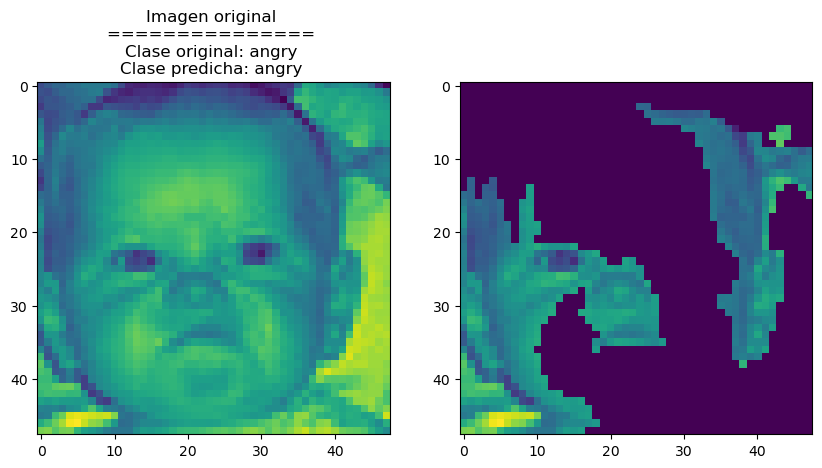

4/4 [==============================] - 0s 5ms/step


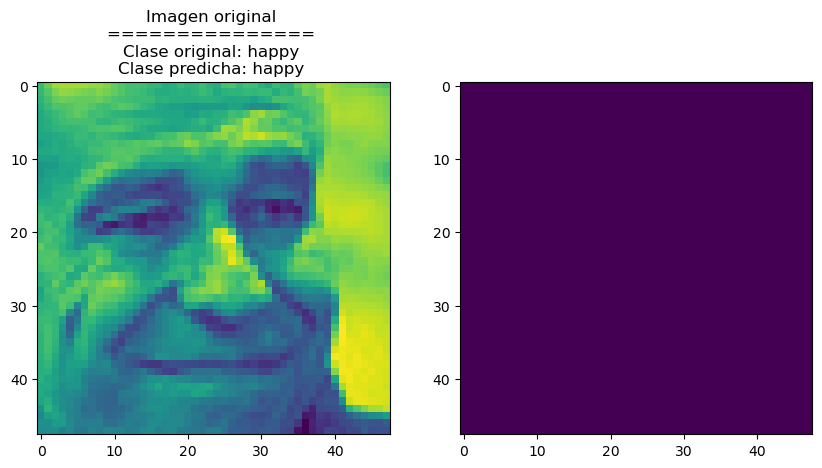

4/4 [==============================] - 0s 5ms/step


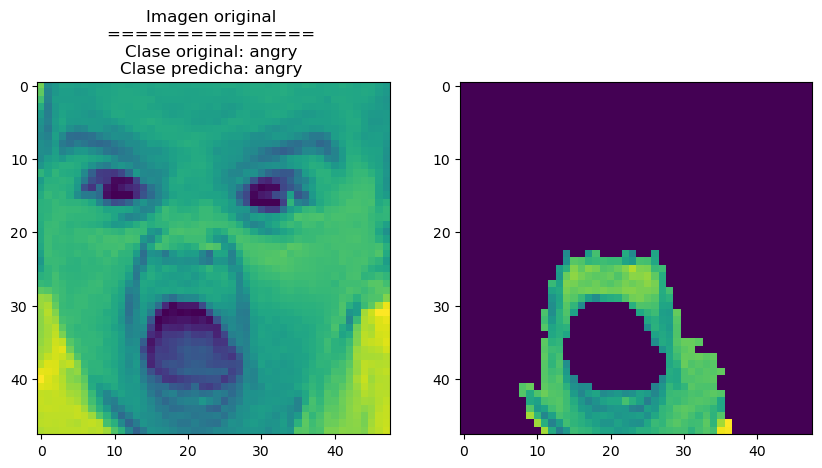

4/4 [==============================] - 0s 5ms/step


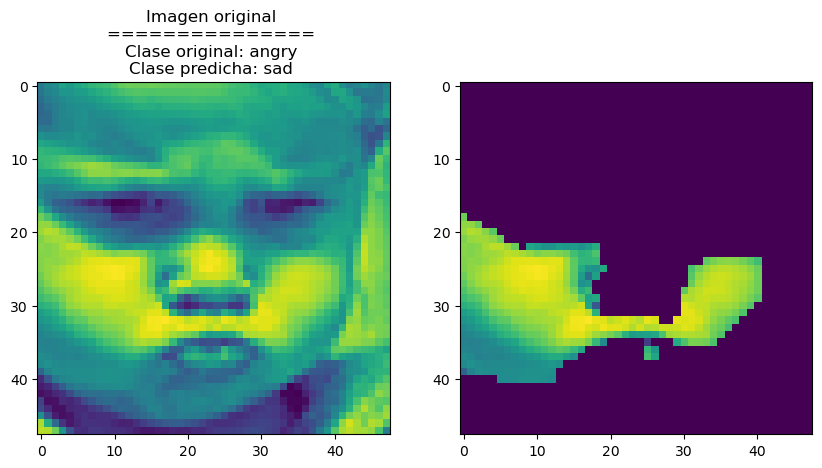

4/4 [==============================] - 0s 5ms/step


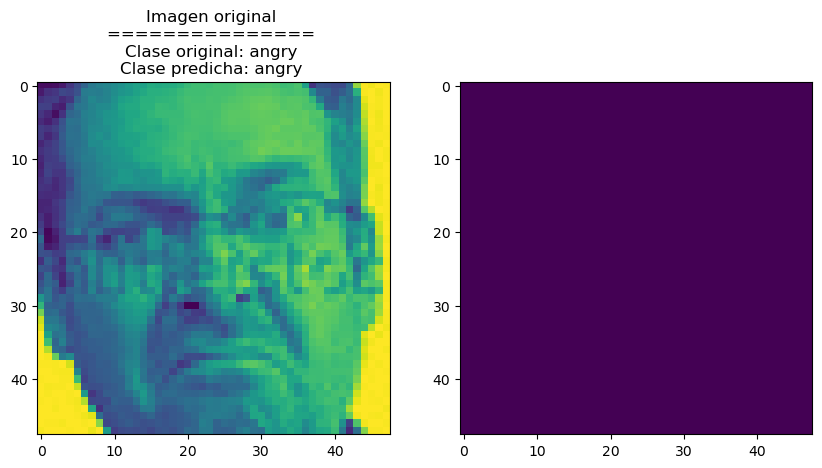

4/4 [==============================] - 0s 3ms/step


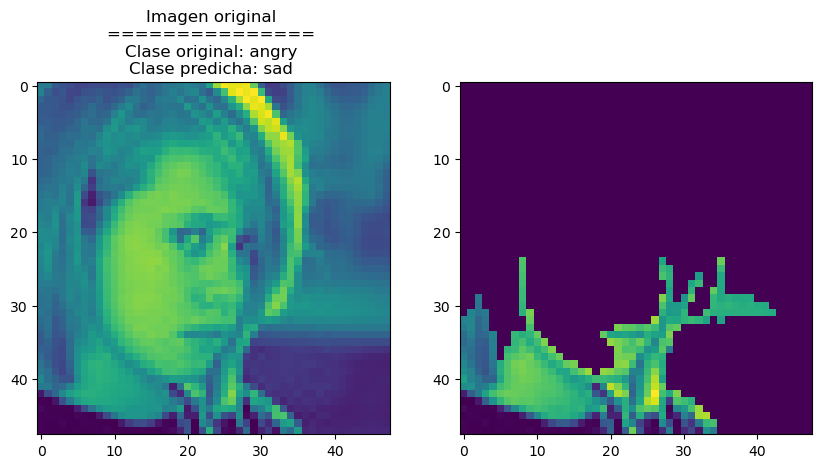

4/4 [==============================] - 0s 5ms/step


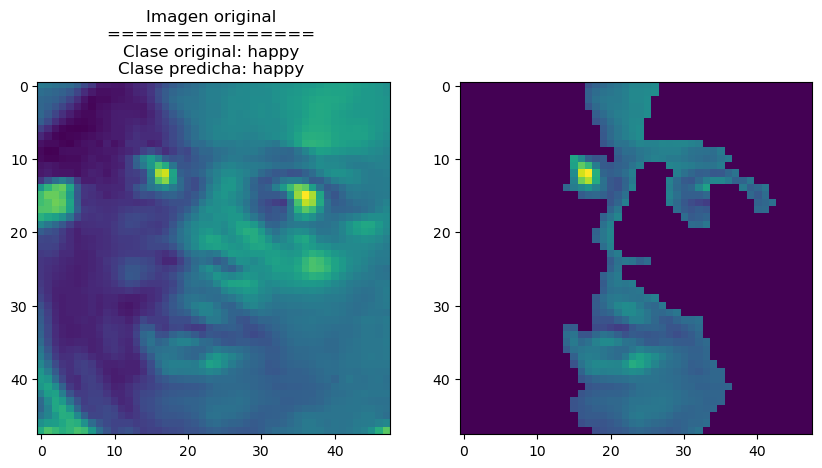

4/4 [==============================] - 0s 4ms/step


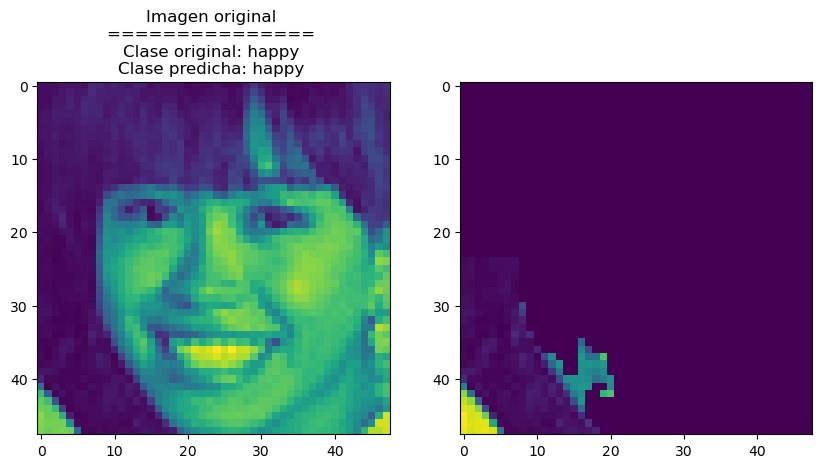

4/4 [==============================] - 0s 5ms/step


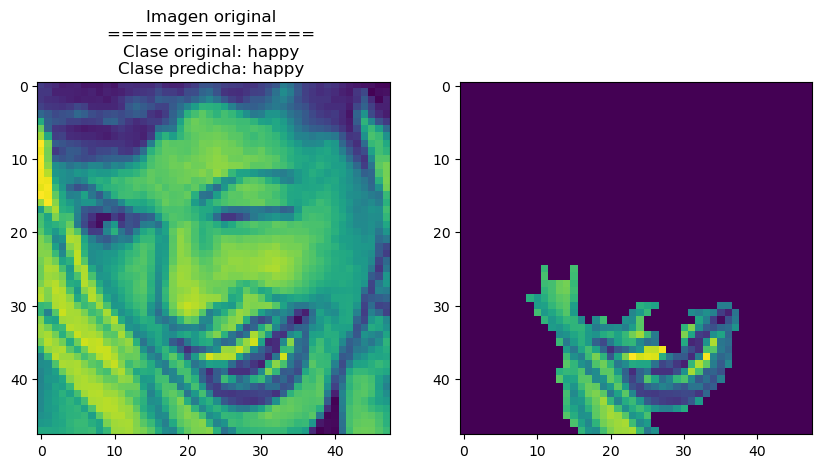

4/4 [==============================] - 0s 5ms/step


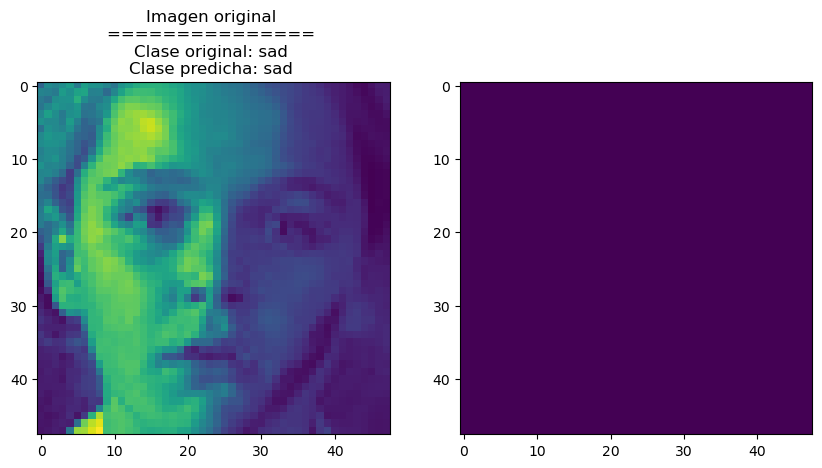

4/4 [==============================] - 0s 5ms/step


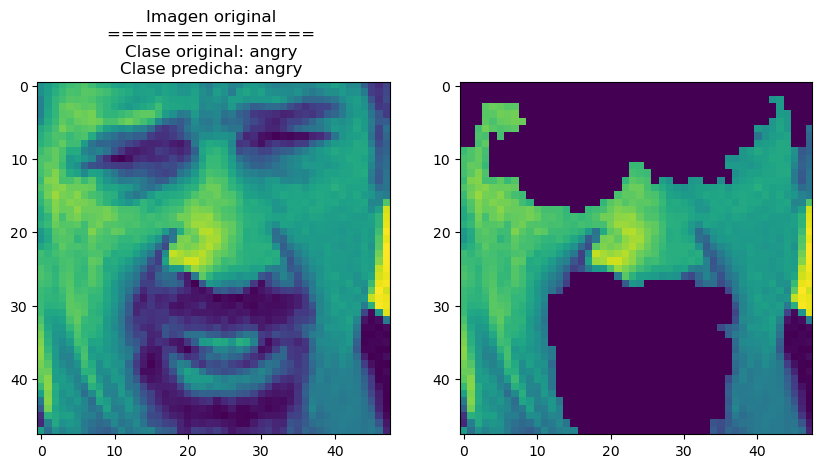

4/4 [==============================] - 0s 5ms/step


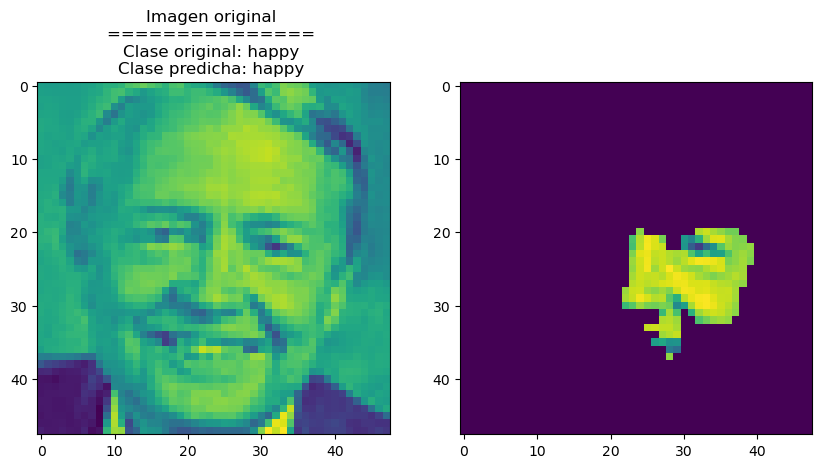

4/4 [==============================] - 0s 5ms/step


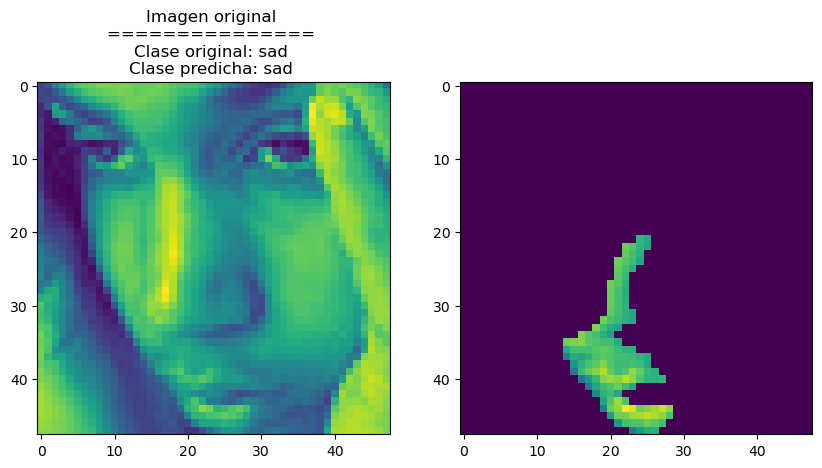

4/4 [==============================] - 0s 5ms/step


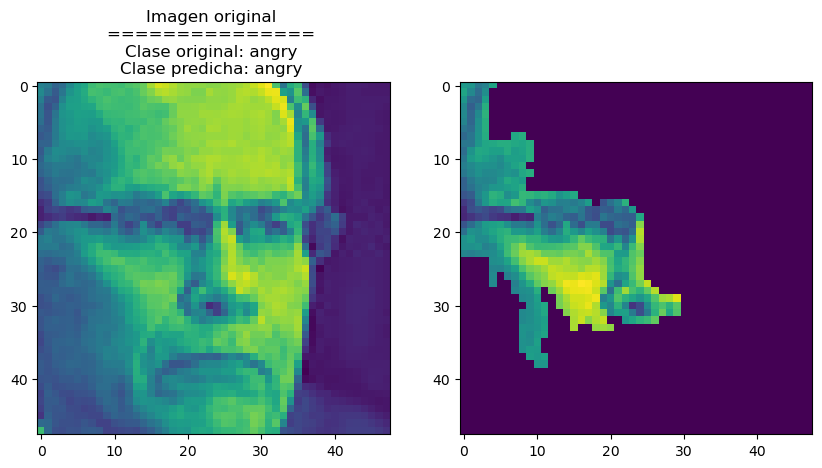

4/4 [==============================] - 0s 5ms/step


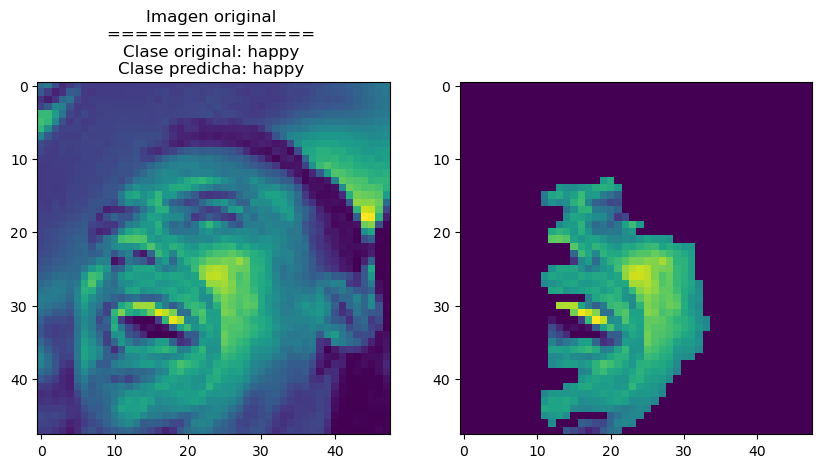

4/4 [==============================] - 0s 5ms/step


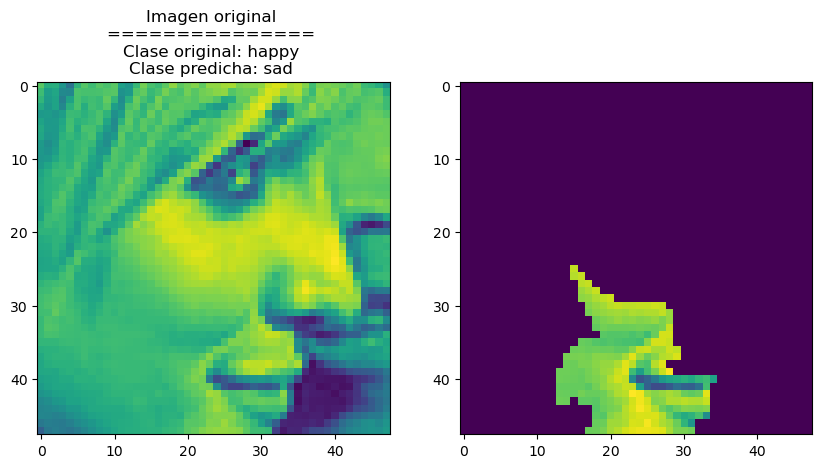

4/4 [==============================] - 0s 4ms/step


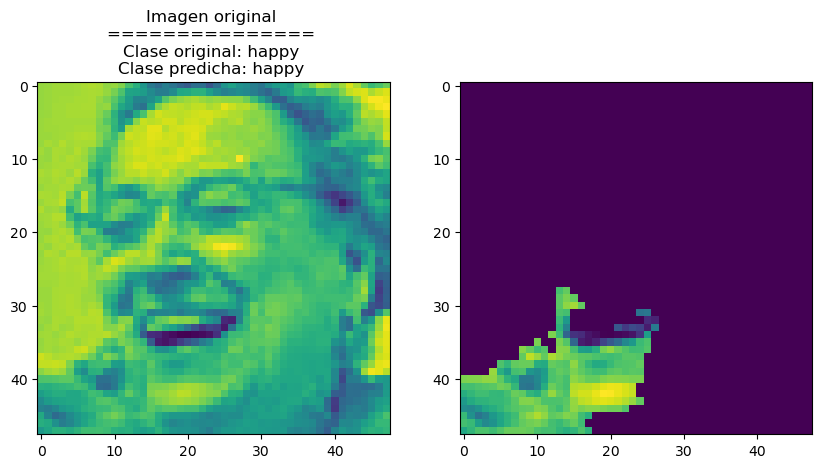

4/4 [==============================] - 0s 5ms/step


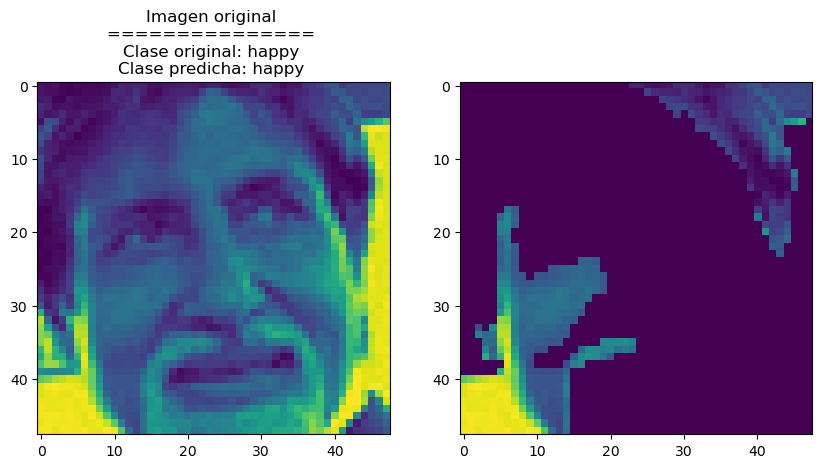

4/4 [==============================] - 0s 4ms/step


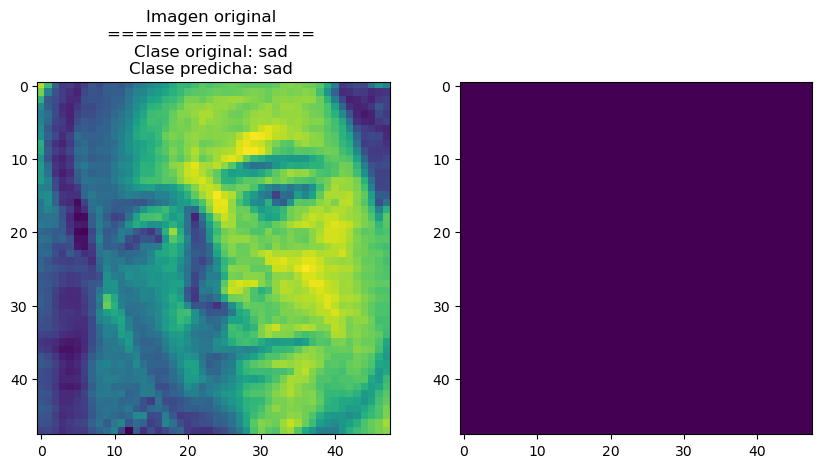

4/4 [==============================] - 0s 5ms/step


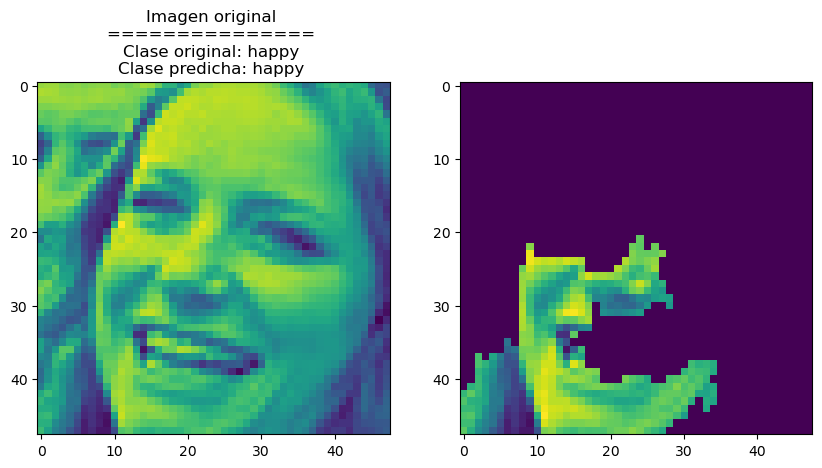

4/4 [==============================] - 0s 5ms/step


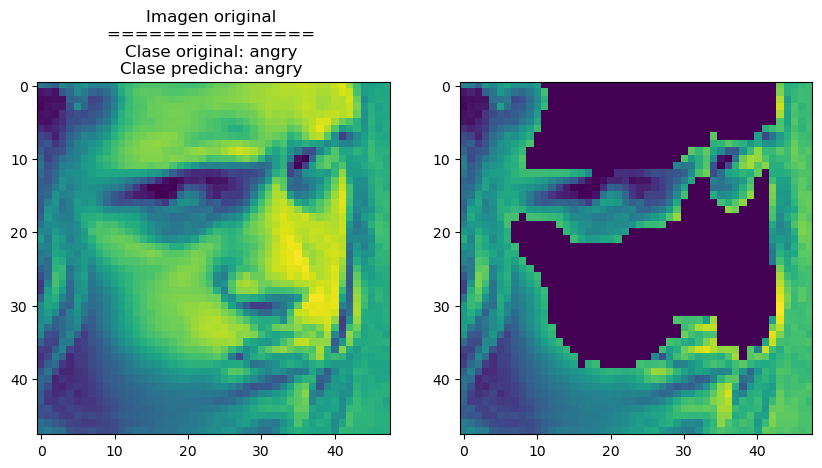

4/4 [==============================] - 0s 5ms/step


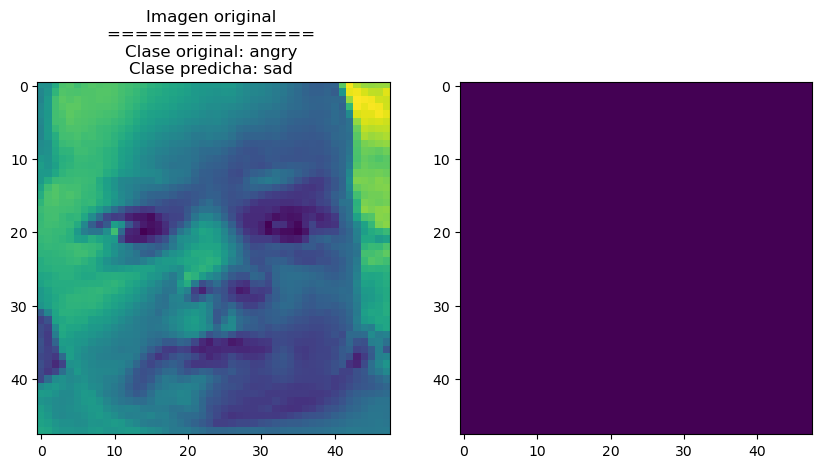

4/4 [==============================] - 0s 5ms/step


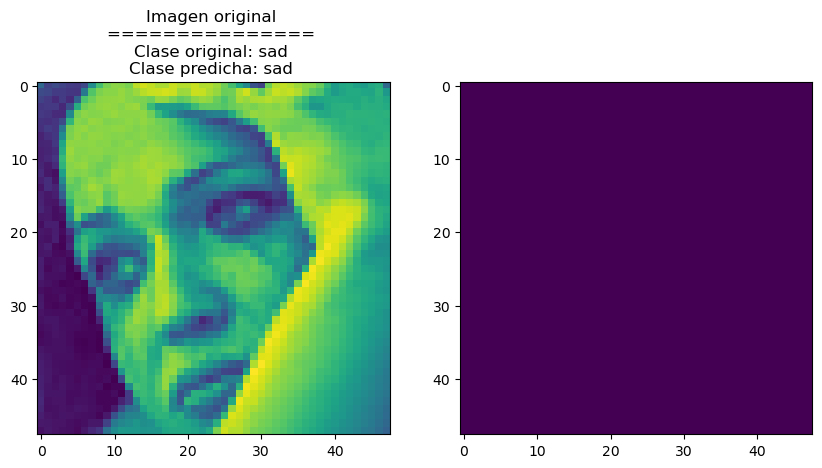

4/4 [==============================] - 0s 5ms/step


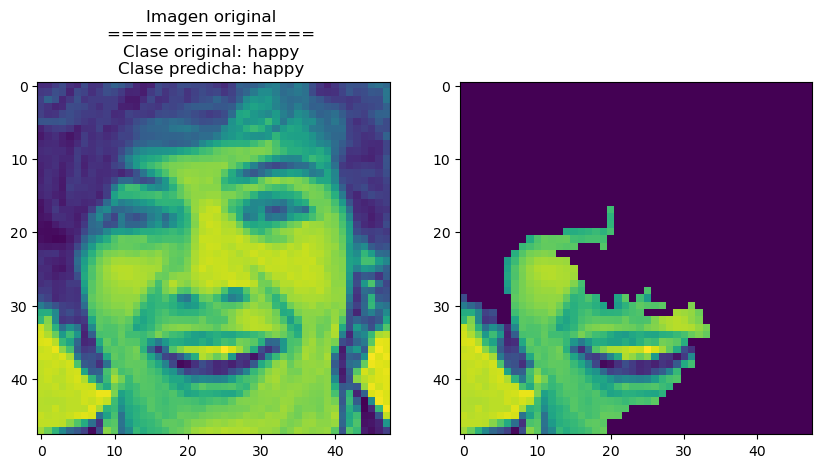

4/4 [==============================] - 0s 4ms/step


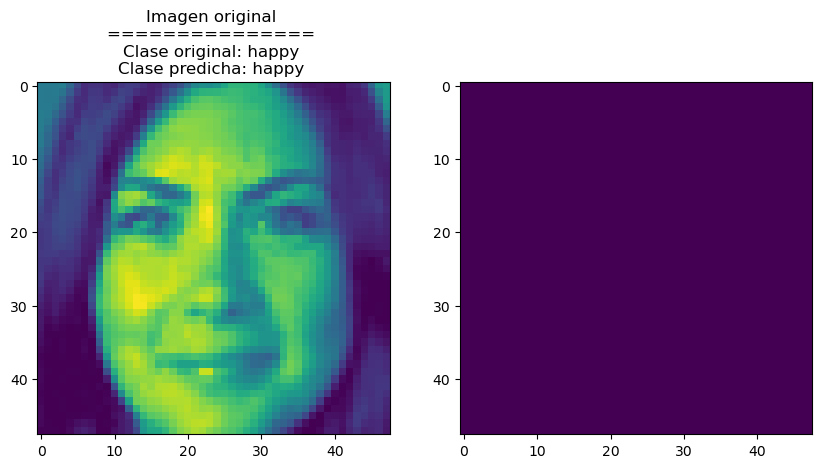

4/4 [==============================] - 0s 5ms/step


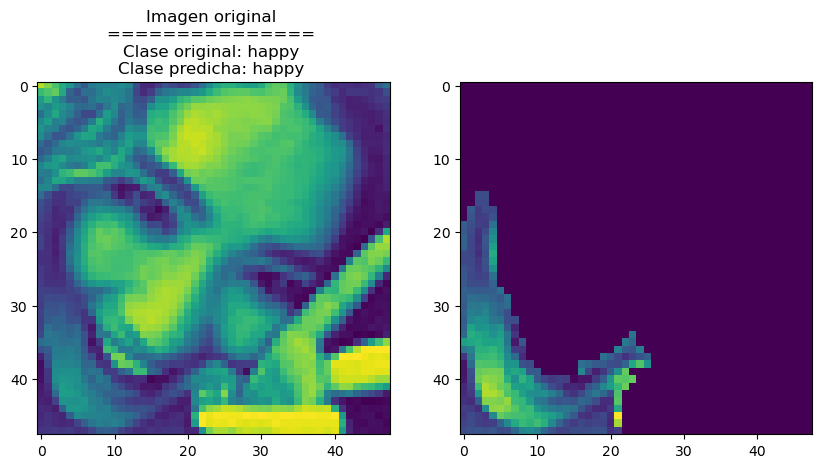

4/4 [==============================] - 0s 5ms/step


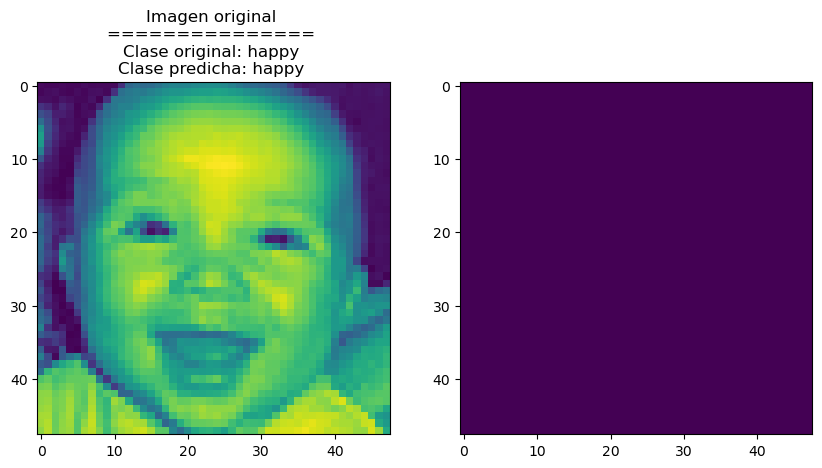

4/4 [==============================] - 0s 4ms/step


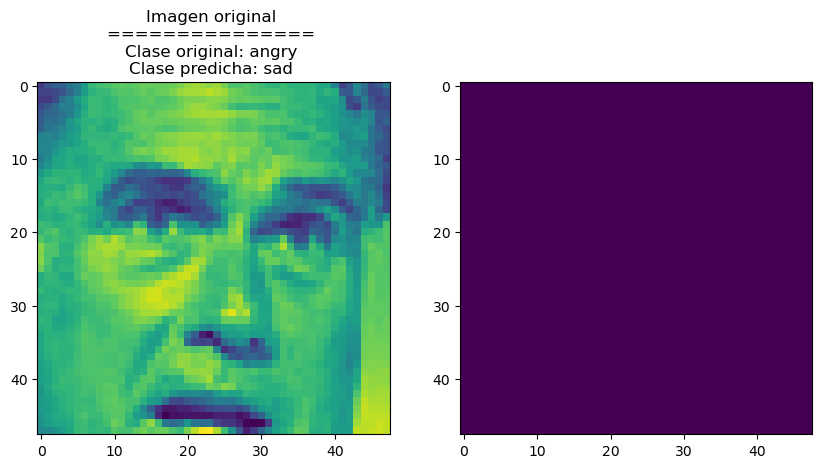

4/4 [==============================] - 0s 5ms/step


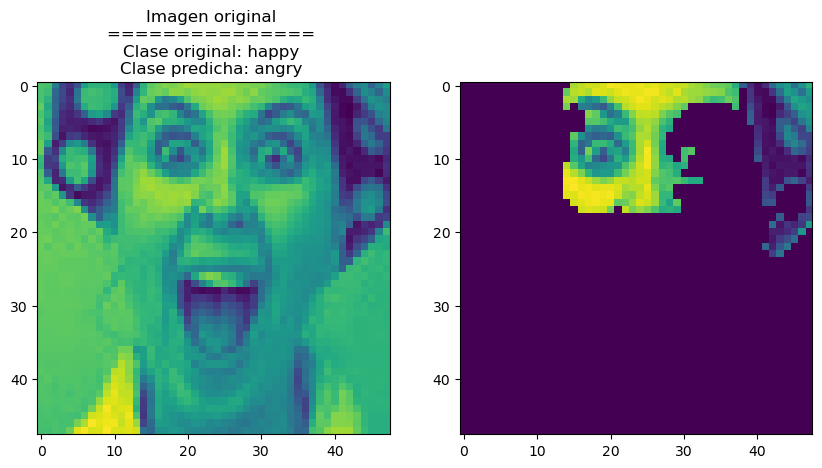

4/4 [==============================] - 0s 5ms/step


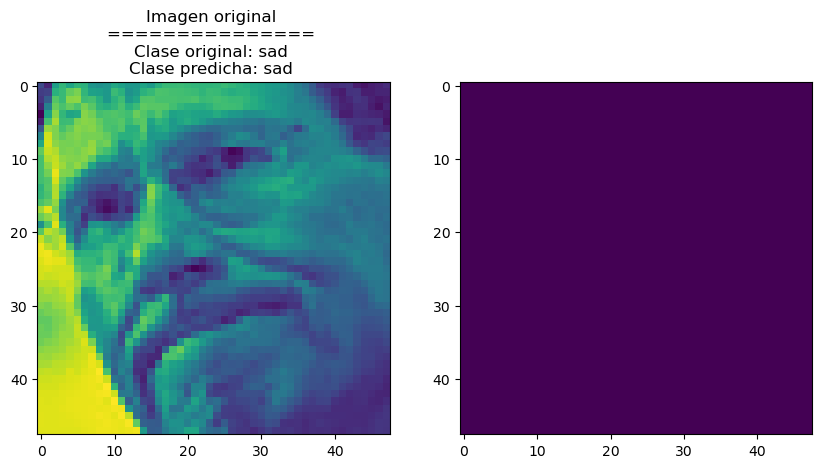

In [17]:
#preciction function
predict_fn = lambda x: model.predict(x)

#image shape
l = list((model.layers[0].input_shape[0][1], model.layers[0].input_shape[0][2])) #original size

#explainer
explainer = AnchorImage(predict_fn, l)

l.append(1)
m = (1,) + tuple(l)

#explain the images
for i in range (0, len(train_test_conditioned[0][1])):
    fig, axes = plt.subplots(1, 2, figsize=(10, 10), sharex=False)

    #original image
    image = train_test_conditioned[0][1][i].reshape(l)
    #prediction of the image
    prediction = model.predict(image.reshape(m)).argmax()
    
    axes[0].imshow(image[:,:,0])
    title_orig = "Imagen original"
    axes[0].set_title(f"{title_orig} \n" +
                         f"{len(title_orig) * '='} \n" +
                         f"Clase original: {load_train_test[0][3][i]} \n" +
                         f"Clase predicha: {numeric_to_class(prediction)} ")

    #explanation of the image
    explanation = explainer.explain(image, threshold=.95, p_sample=.8, seed=0)
    
    axes[1].imshow(explanation.anchor[:,:,0])
    plt.show()

#### IntegratedGradients

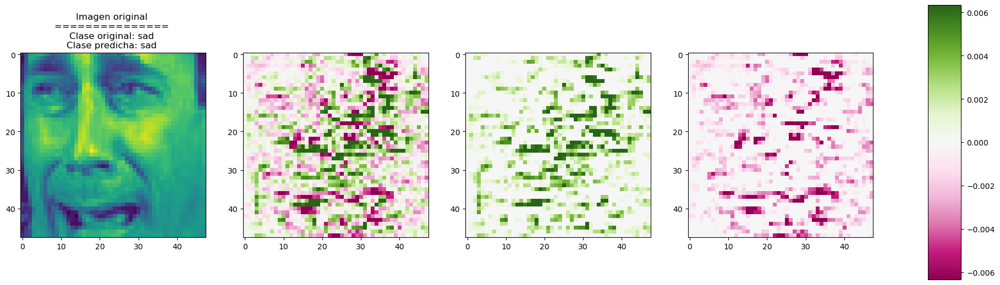

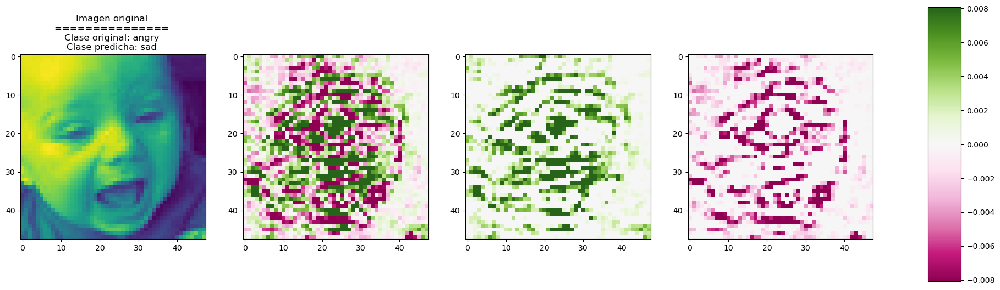

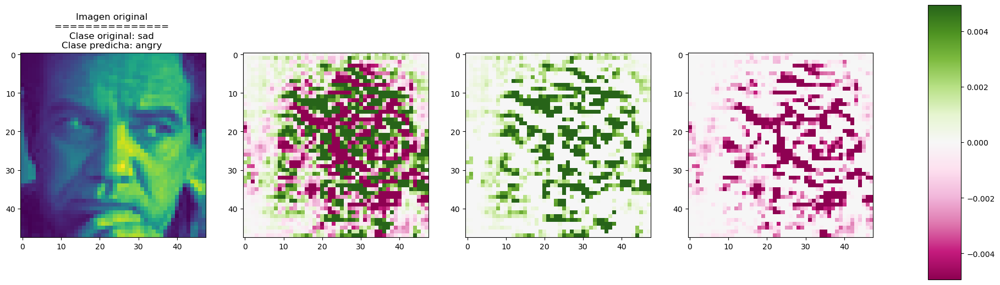

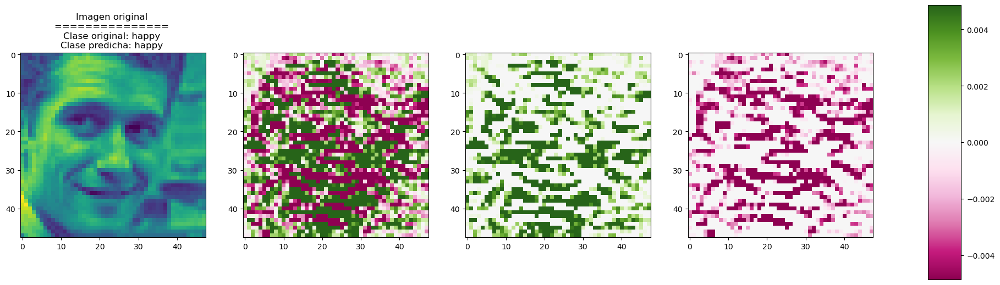

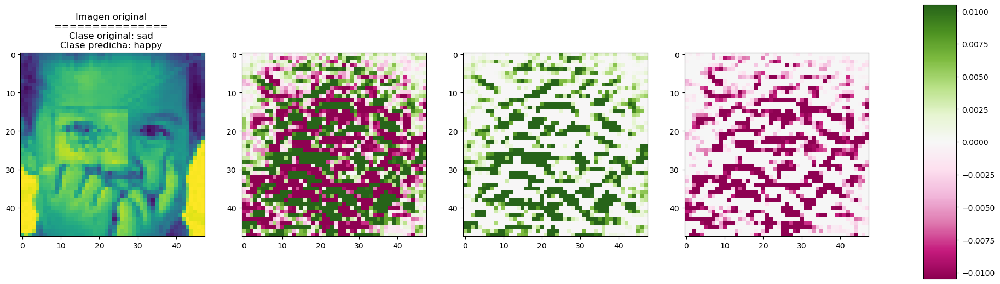

...

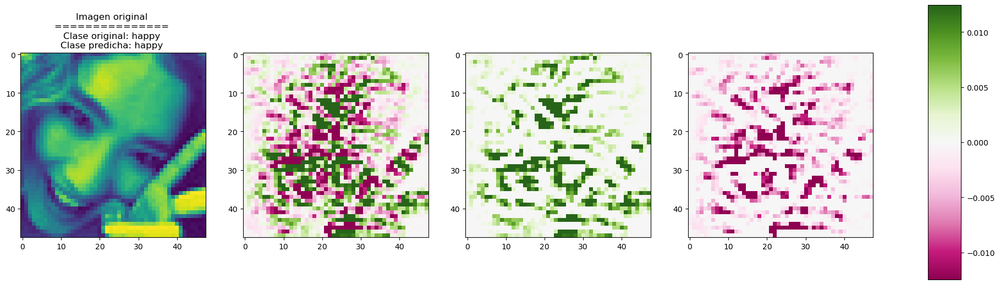

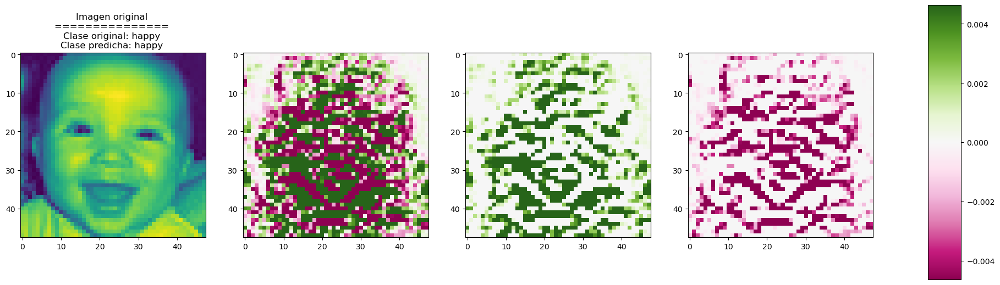

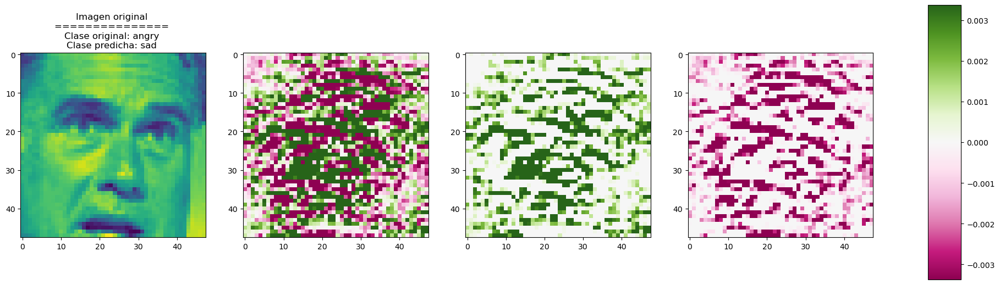

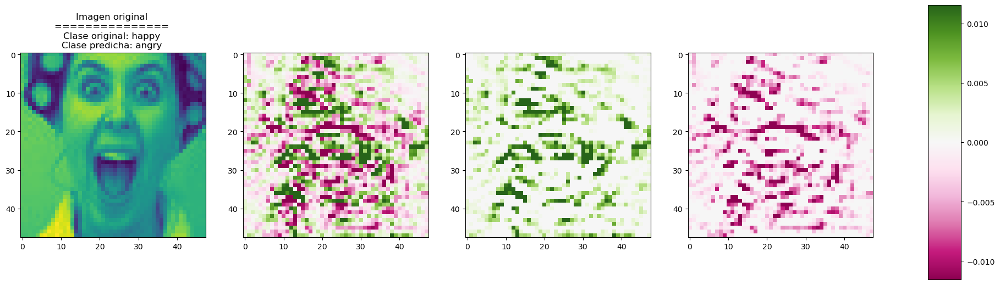

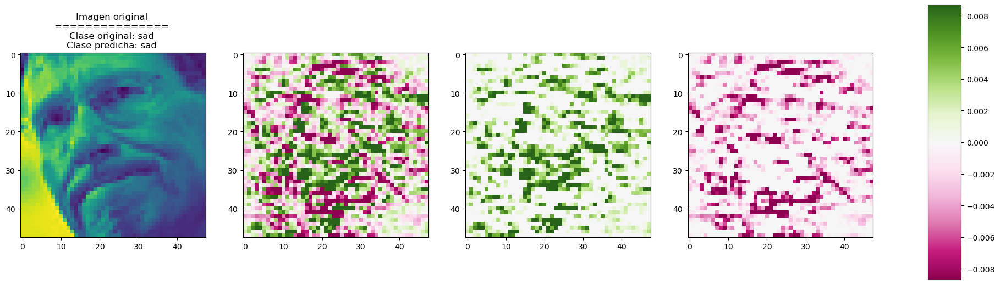

In [18]:
#explainer
ig  = IntegratedGradients(model, n_steps=50, method="gausslegendre")

for i in range (0, len(train_test_conditioned[0][1])):
    instance = train_test_conditioned[0][1]

    #image size
    l = list((model.layers[0].input_shape[0][1], model.layers[0].input_shape[0][2])) #original size
    l.append(1)
    l = (1,) + tuple(l)
    
    prediction = model(instance[i].reshape(l)).numpy().argmax(axis=1)
    explanation = ig.explain(instance[i].reshape(l), baselines=None, target=prediction)
    # Metadata from the explanation object
    explanation.meta
    # Data fields from the explanation object
    explanation.data.keys()
    # Get attributions values from the explanation object
    attrs = explanation.attributions[0]
    cmap_bound = np.abs(attrs[0, 1]).max()

    fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20,10))
    # original image
    ax[0].imshow(train_test_conditioned[0][1][i].squeeze())
    title_orig = "Imagen original"
    ax[0].set_title(f"{title_orig} \n" +
                    f"{len(title_orig) * '='} \n" +
                    f"Clase original: {decode(train_test_conditioned[0][3][i])} \n" +
                    f"Clase predicha: {numeric_to_class(prediction[0])} ")
    # attributions
    attr = attrs
    im = ax[1].imshow(attr.squeeze(), vmin=-cmap_bound, vmax=cmap_bound, cmap='PiYG')

    # positive attributions
    attr_pos = attr.clip(0, 1)
    im_pos = ax[2].imshow(attr_pos.squeeze(), vmin=-cmap_bound, vmax=cmap_bound, cmap='PiYG')

    # negative attributions
    attr_neg = attr.clip(-1, 0)
    im_neg = ax[3].imshow(attr_neg.squeeze(), vmin=-cmap_bound, vmax=cmap_bound, cmap='PiYG')
    fig.colorbar(im, cax=fig.add_axes([0.95, 0.25, 0.03, 0.5]));
    
    plt.show()

#### GradientSimilarity

In [19]:
#explainer
gsm = GradientSimilarity(model, categorical_crossentropy, precompute_grads=False, sim_fn='grad_cos')
gsm.fit(train_test_conditioned[0][0], train_test_conditioned[0][2])

#images to be explained
X_sample, y_sample = train_test_conditioned[0][1], train_test_conditioned[0][3]
preds = model.predict(X_sample)
expls = gsm.explain(X_sample, y_sample)

4/4 [==============================] - 0s 6ms/step


In [20]:
#similar images
ds = []
for j in range(len(X_sample)):
    y_sim = train_test_conditioned[0][2][expls.data['ordered_indices'][j]]
    X_sim = train_test_conditioned[0][0][expls.data['ordered_indices'][j][:3]] #tres imágenes similares
    preds_sim = model.predict(X_sim)

    d = {'x': X_sample[j],
         'y': y_sample[j].argmax(),
         'pred':preds[j],
         'y_sim': y_sim,
         'preds_sim': preds_sim}
    ds.append(d)

1/1 [==============================] - 0s 22ms/step


C:\Users\javie\AppData\Local\Temp\ipykernel_8848\3654236502.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, 4, figsize=(20, 20), sharex=False)


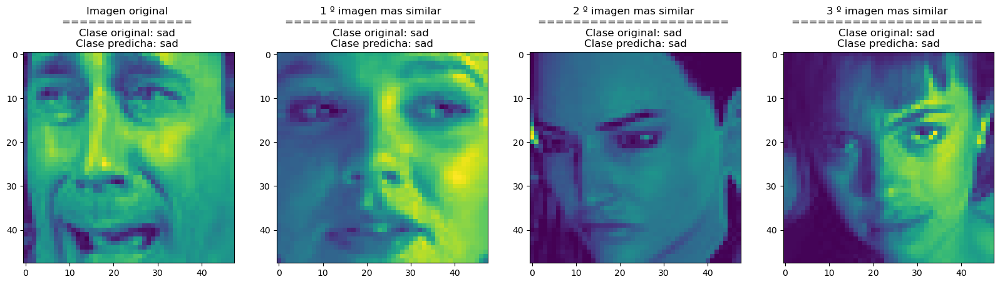

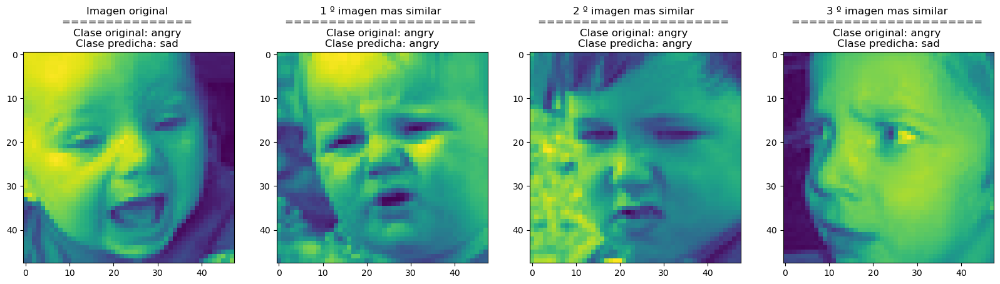

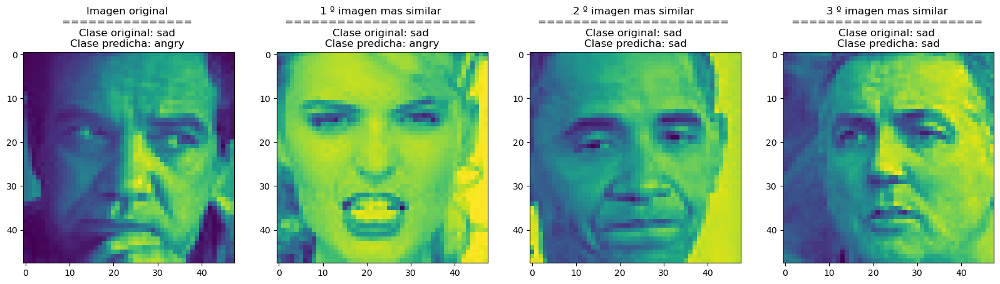

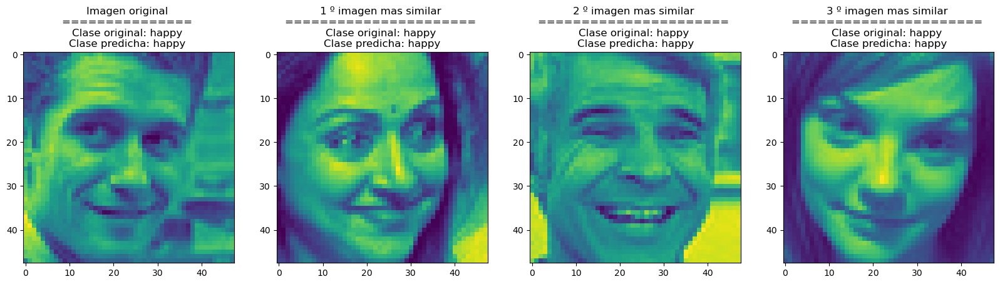

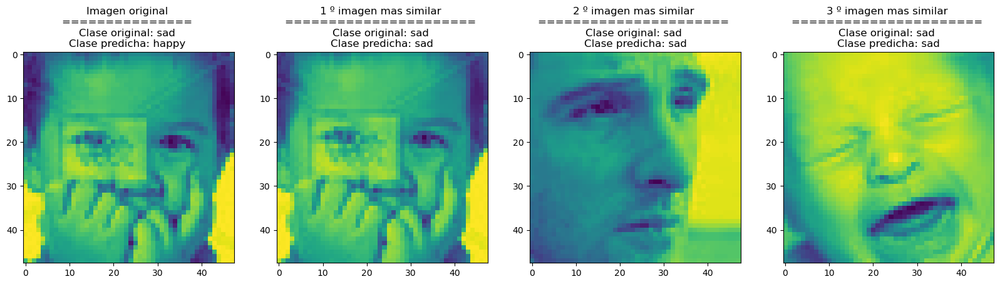

...

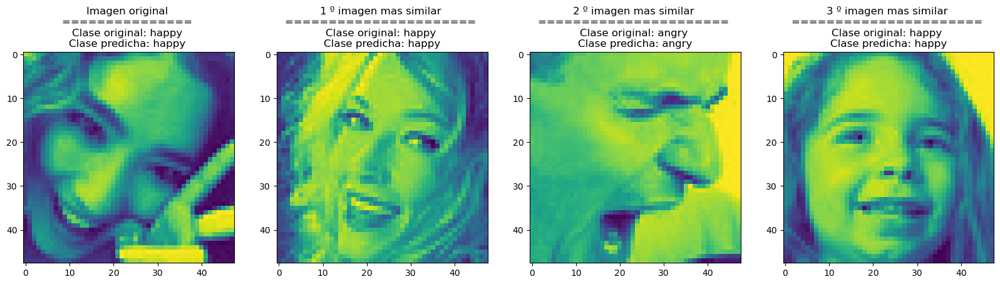

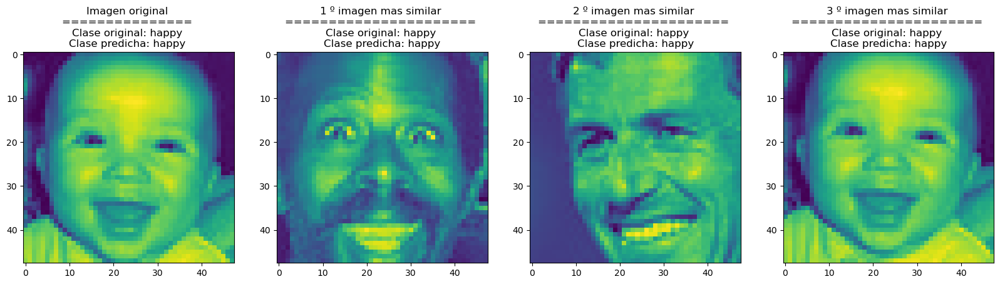

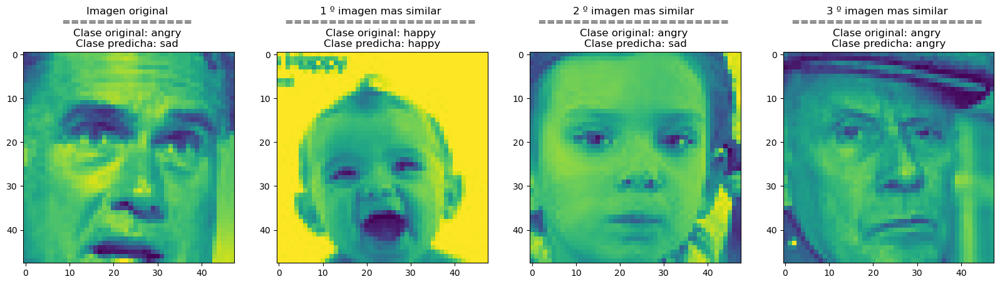

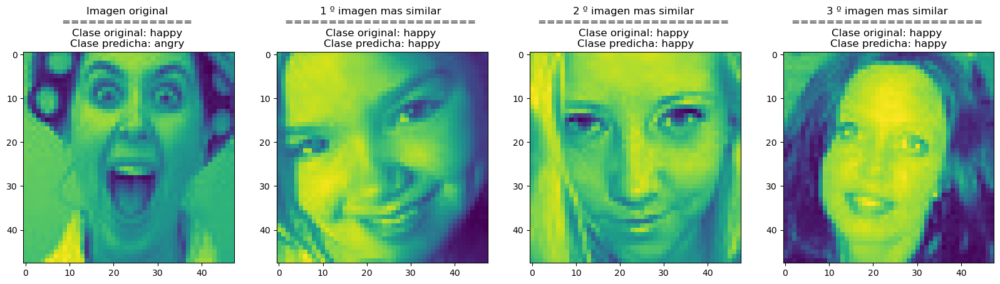

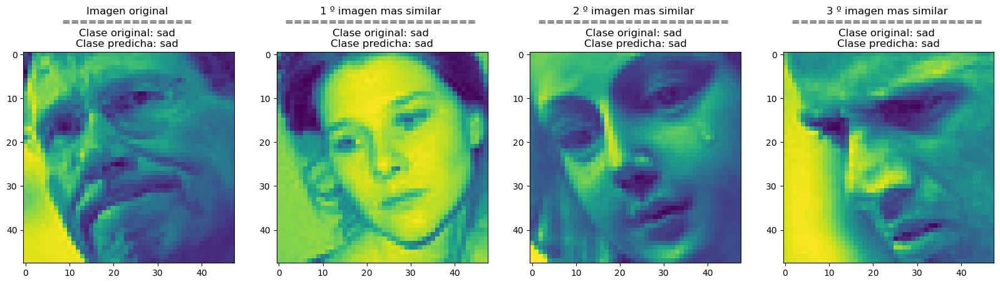

In [21]:
#explain the images
for j in range(len(ds)):
    fig, axes = plt.subplots(1, 4, figsize=(20, 20), sharex=False)
    d = ds[j]
    axes[0].imshow(d['x'])
    label_orig = int_to_str[d['y']].split(',')[0]
    if len(label_orig) > 16:
        label_orig = label_orig[:13] + '...'
    pred_orig = int_to_str[d['pred'].argmax()].split(',')[0]
    if len(pred_orig) > 16:
        pred_orig = pred_orig[:13] + '...'
    title_orig = "Imagen original"
    axes[0].set_title(f"{title_orig} \n" +
                         f"{len(title_orig) * '='} \n" +
                         f"Clase original: {label_orig} \n" +
                         f"Clase predicha: {pred_orig} ")
    for i in range(0,3):
        label_sim = int_to_str[d['y_sim'][i].argmax()].split(',')[0]
        if len(label_sim) > 16:
            label_sim = label_sim[:13] + '...'
        pred_sim = int_to_str[d['preds_sim'][i].argmax()].split(',')[0]
        if len(pred_sim) > 16:
            pred_sim = pred_sim[:13] + '...'
        most_similar = expls.data['most_similar'][j][i]

        axes[i+1].imshow(most_similar)
        title_most_sim = f"{i+1} º imagen mas similar"
        axes[i + 1].set_title(f"{title_most_sim} \n" +
                                 f"{len(title_most_sim) * '='} \n"+
                                 f"Clase original: {label_sim} \n" +
                                 f"Clase predicha: {pred_sim}")
plt.show()